# **Exploratory Data Analysis**


This notebook analyzes the distribution of labels, class imbalance, language-specific patterns, and label dependencies across the three subtasks. The analysis motivates the choice of modeling strategies and evaluation metrics

## 1️⃣ Dataset overview

a-Import Libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
from wordcloud import WordCloud


sns.set(style="whitegrid")


 Create Figures Directory (if it doesn’t exist)

In [ ]:
figures_dir = "/content/drive/MyDrive/NLP course/Figures/"
os.makedirs(figures_dir, exist_ok=True)


## Subtask 1: Polarization Detection (True/False)

a-Load English and Swahili Data

In [ ]:
# Path to the first language  english dataset
path_en  = "/content/drive/MyDrive/NLP course /dev_phase /subtask1/train/eng.csv"
path_sw = "/content/drive/MyDrive/NLP course /dev_phase /subtask1/train/swa.csv"
df_1 = pd.read_csv(path_en)  # English
df_1['language'] = 'English'

df_2 = pd.read_csv(path_sw)  # Swahili
df_2['language'] = 'Swahili'


 b-General Statistics

In [ ]:
def general_statistics(df):
    lang = df['language'].iloc[0]
    print(f"--- General Statistics for {lang} ---")

    # Total number of samples
    total_samples = len(df)
    print(f"Total samples: {total_samples}")

    # Polarization label counts
    label_counts = df['polarization'].value_counts()
    print("Label counts (0 = Non-Polarized, 1 = Polarized):")
    print(label_counts)

    # Percentage per class
    label_percent = df['polarization'].value_counts(normalize=True) * 100
    print("Percentage per class:")
    print(label_percent)

    # Text length statistics
    df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))
    print(f"Text length (tokens) statistics:")
    print(f"  Mean: {df['text_len'].mean():.2f}")
    print(f"  Median: {df['text_len'].median():.2f}")
    print(f"  Min: {df['text_len'].min()}")
    print(f"  Max: {df['text_len'].max()}")
    print(f"  Std: {df['text_len'].std():.2f}")

    print("\n")


In [ ]:
general_statistics(df_1)  # English
general_statistics(df_2)  # Swahili


--- General Statistics for English ---
Total samples: 3222
Label counts (0 = Non-Polarized, 1 = Polarized):
polarization
0    2047
1    1175
Name: count, dtype: int64
Percentage per class:
polarization
0    63.531968
1    36.468032
Name: proportion, dtype: float64
Text length (tokens) statistics:
  Mean: 12.26
  Median: 9.00
  Min: 4
  Max: 60
  Std: 8.02


--- General Statistics for Swahili ---
Total samples: 6991
Label counts (0 = Non-Polarized, 1 = Polarized):
polarization
1    3504
0    3487
Name: count, dtype: int64
Percentage per class:
polarization
1    50.121585
0    49.878415
Name: proportion, dtype: float64
Text length (tokens) statistics:
  Mean: 12.54
  Median: 12.00
  Min: 2
  Max: 48
  Std: 6.05




c-Polarization Label Distribution

In [ ]:
def plot_polarization_distribution(df, figures_dir):
    lang = df['language'].iloc[0]

    counts = df['polarization'].value_counts()

    plt.figure(figsize=(6,4))

    # FIX: Assign x-variable to 'hue' and set 'legend=False' to silence the FutureWarning
    sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette="coolwarm", legend=False)

    plt.title(f"Task 1: Polarization Label Distribution ({lang})")
    plt.xlabel("Label (0 = Non-Polarized, 1 = Polarized)")
    plt.ylabel("Number of Samples")

    # Save figure
    filename = f"task1_label_distribution_{lang}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    # Show figure
    plt.show()
    plt.close()

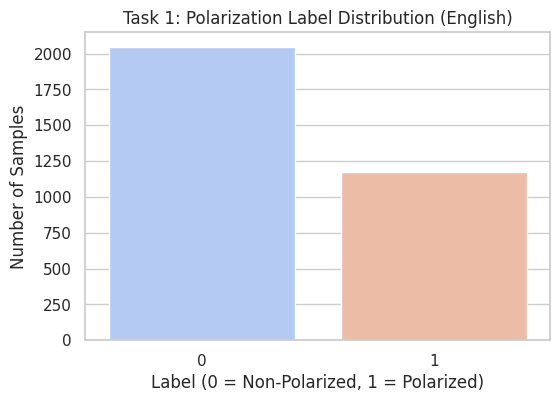

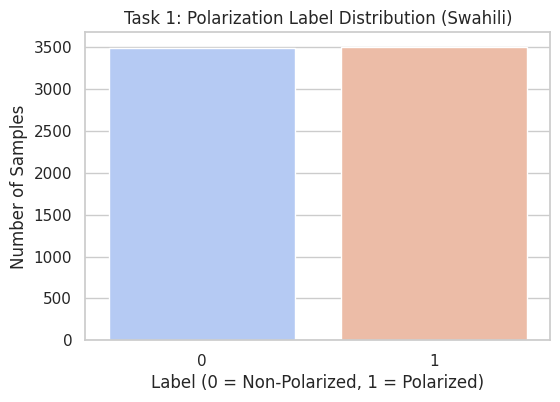

In [ ]:
plot_polarization_distribution(df_1, figures_dir)  # English
plot_polarization_distribution(df_2, figures_dir)  # Swahili

In [ ]:
def plot_combined_polarization_distribution_flexible(df_list, figures_dir, save_filename="polarization_distribution_task1.pdf"):

    if len(df_list) < 2:
        print("Error: This function requires at least two DataFrames in df_list.")
        return

    data_points = []
    lang_names = []

    for df in df_list:
        counts = df['polarization'].value_counts().sort_index()
        data_points.append(counts.values)

        lang = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Dataset'
        lang_names.append(lang)

    labels = df_list[0]['polarization'].unique().tolist()
    labels.sort()

    x = np.arange(len(labels))
    n_datasets = len(df_list)
    total_width = 0.8
    width = total_width / n_datasets

    plt.figure(figsize=(8,5))

    start_x = x - (total_width / 2) + (width / 2)

    colors = ['blue', 'red', 'lightgreen', 'gold', 'lightcoral']

    for i, counts_values in enumerate(data_points):
        plt.bar(start_x + i * width, counts_values, width, label=lang_names[i], color=colors[i % len(colors)])

    lang_title_str = " vs ".join(lang_names)

    plt.xlabel("Label (0 = Non-Polarized, 1 = Polarized)")
    plt.ylabel("Number of Samples")
    plt.title(f"Task 1: Polarization Label Distribution ({lang_title_str})")

    plt.xticks(x, labels)

    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.savefig(os.path.join(figures_dir, save_filename))

    plt.show()
    plt.close()

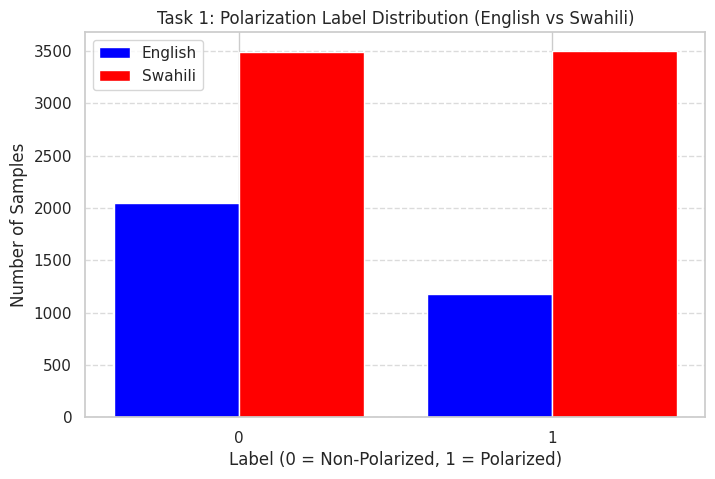

In [ ]:

# 1.  list of DataFrames
df_list_to_plot = [df_1, df_2]
plot_combined_polarization_distribution_flexible(df_list_to_plot, figures_dir)


Figure 2 — Text Length Distribution

In [ ]:
def plot_text_length_distribution(df, figures_dir):

    # Calculate text length (number of tokens)
    df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))

    # Get the language for the title and filename
    lang = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang.lower()

    # Determine the plot color based on the language preference
    if 'english' in lang_lower:
        plot_color = 'blue'
    elif 'swahili' in lang_lower:
        plot_color = 'red'
    else:
        plot_color = 'purple' # Default fallback color (similar to original image)

    # Create the plot
    plt.figure(figsize=(8,5))

    # Use the determined color
    sns.histplot(df['text_len'], bins=30, kde=True, color=plot_color)

    # Set plot titles and labels
    plt.title(f"Task 1: Text Length Distribution ({lang})")
    plt.xlabel("Number of Tokens")
    plt.ylabel("Number of Samples")

    # Save figure as PDF
    filename = f"task1_text_length_{lang}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    # Show and close figure
    plt.show()
    plt.close()

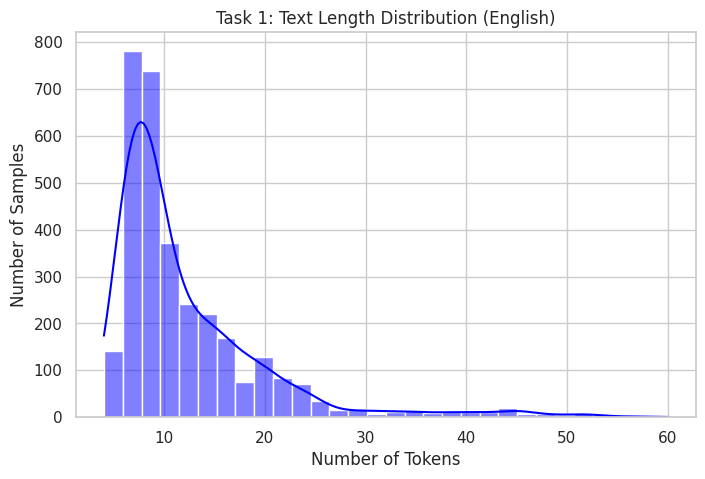

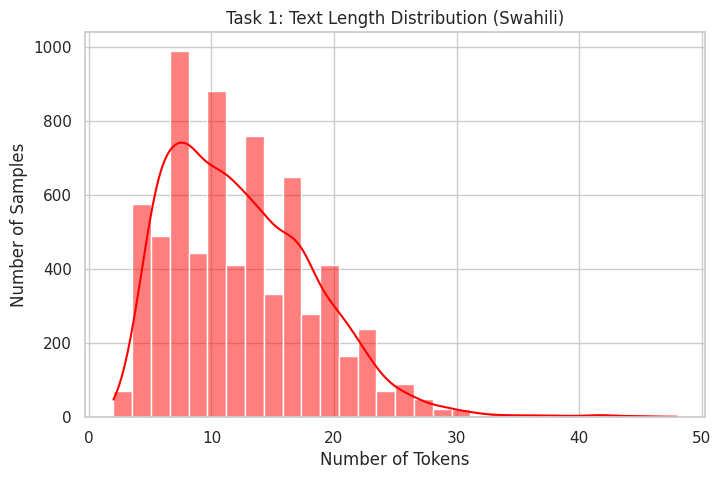

In [ ]:
plot_text_length_distribution(df_1, figures_dir)
plot_text_length_distribution(df_2, figures_dir)

---

## 1. Data Statistics and Interpretation (Task 1: Polarization)

The following statistics provide an initial view of the two datasets (English and Swahili) with respect to sample size, label distribution, and text length.

### General Statistics Comparison

| Statistic | English Dataset | Swahili Dataset | Interpretation |
| :--- | :--- | :--- | :--- |
| **Total Samples** | 3222 | 6991 | The Swahili dataset is significantly **larger** (more than double the size) than the English dataset. |
| **Polarization (Label 1) Count** | 1175 | 3504 | The Swahili dataset contains nearly **three times** the number of Polarized samples as the English dataset. |
| **Polarized (Label 1) Percentage** | **36.47%** | **50.12%** | The Swahili data is much more **balanced**, with approximately 50% polarization. The English data is imbalanced, with a bias towards the Non-Polarized (0) class. |
| **Text Length (Mean)** | 12.26 tokens | 12.54 tokens | The mean text length is nearly **identical** across both languages. |
| **Text Length (Median)** | 9.00 tokens | 12.00 tokens | The Swahili text has a **higher median length**, suggesting the majority of Swahili samples are slightly longer than English samples, which are pulled down by shorter texts. |
| **Text Length (Std)** | 8.02 | 6.05 | The English data has a **higher standard deviation**, indicating its text lengths are more spread out (more variance) compared to the Swahili data. |



### Key Observations

1.  **Dataset Size:** The **Swahili dataset is larger**, which generally benefits model training.
2.  **Label Distribution:** The **English dataset is imbalanced (64% Non-Polarized)**, which may require techniques like oversampling or class weighting during model training to prevent the classifier from being biased toward the majority class. The **Swahili dataset is nearly perfectly balanced (50% Polarized)**.
3.  **Text Length:** While the average (mean) length is similar, the **English text lengths are more variable (higher Std)** and typically shorter at the 50th percentile (lower median) than the Swahili text. This suggests the English dataset might contain a higher proportion of very short or very long outlier texts.

In [ ]:
def plot_side_by_side_polarization_wordcloud(df, figures_dir):
    """
    Generates two side-by-side word clouds for the 'Polarized' (1) and
    'Non-Polarized' (0) classes of a single DataFrame, using language-specific colors.

    Args:
        df (pd.DataFrame): The input DataFrame (e.g., df_1 or df_2).
        figures_dir (str): The directory path where the figure should be saved.
    """

    # 1. --- Determine Language and Colors ---
    lang = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang.lower()

    # Define colors: Dark for Polarized (1), Light for Non-Polarized (0)
    if 'english' in lang_lower:
        color_pair = ('#4169E1', '#87CEFA')  # Dark Blue, Light Blue
    elif 'swahili' in lang_lower:
        color_pair = ('#B22222', '#FA8072')  # Dark Red, Light Red
    else:
        color_pair = ('#333333', '#CCCCCC') # Default fallback

    # 2. --- Extract Class Texts ---
    text_class1 = " ".join(df[df['polarization'] == 1]["text"].astype(str).tolist())
    text_class0 = " ".join(df[df['polarization'] == 0]["text"].astype(str).tolist())

    if not text_class1 and not text_class0:
        print(f"No text data found in the DataFrame for {lang}.")
        return

    # 3. --- Create 2 Word Clouds (Generators) ---
    wc_params = dict(width=600, height=400, background_color="white", colormap=None)
    wc1 = WordCloud(**wc_params).generate(text_class1)
    wc0 = WordCloud(**wc_params).generate(text_class0)

    # 4. --- Plot Side-by-Side ---
    plt.figure(figsize=(14, 7))

    # --- Polarized (Class 1) Plot (Dark Color) ---
    plt.subplot(1, 2, 1)
    # Use recolor with a lambda function to apply the specific dark color
    plt.imshow(wc1.recolor(color_func=lambda *args, **kwargs: color_pair[0]), interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Polarized (1) - {lang}", fontsize=14, color=color_pair[0])

    # --- Non-Polarized (Class 0) Plot (Light Color) ---
    plt.subplot(1, 2, 2)
    # Use recolor with a lambda function to apply the specific light color
    plt.imshow(wc0.recolor(color_func=lambda *args, **kwargs: color_pair[1]), interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Non-Polarized (0) - {lang}", fontsize=14, color=color_pair[1])

    plt.suptitle(f"Task 1: Polarization Word Cloud Comparison ({lang})", fontsize=16, y=1.02)
    plt.tight_layout()

    # 5. --- Save and Show ---
    filename = f"task1_wordcloud_comparison_{lang}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()



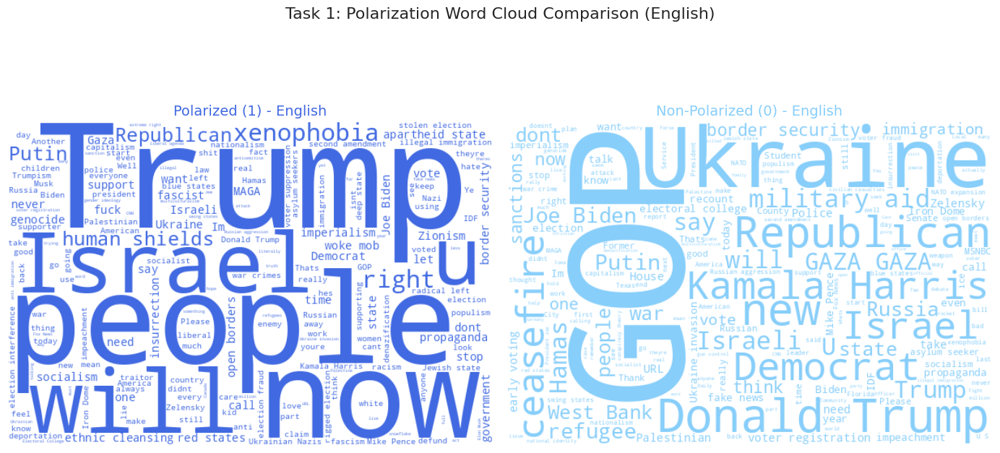

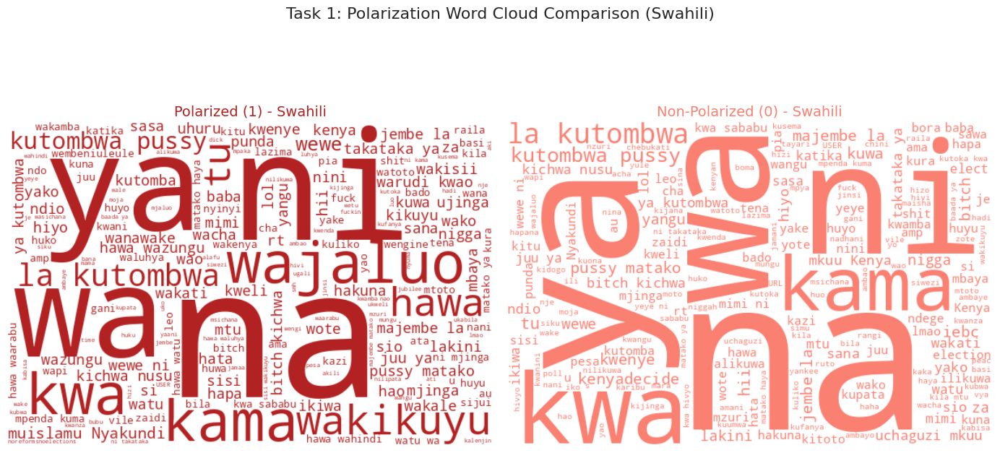

In [ ]:
plot_side_by_side_polarization_wordcloud(df_1, figures_dir)
plot_side_by_side_polarization_wordcloud(df_2, figures_dir)



---

## 2. Word Cloud Analysis (Polarization Comparison)

Word clouds visualize the most frequent terms in the text corpus for each class, revealing key linguistic and topical differences between polarized and non-polarized content.

### English Word Clouds

The English word clouds clearly demonstrate a significant shift in vocabulary and tone between the two classes:

| Class | Key Terms & Observations | Interpretation |
| :--- | :--- | :--- |
| **Polarized (1) - Dark Blue** | **Trump, Israel, people, now, fuck, xenophobia, Republican, fascist, genocide, Imperialism.** The dominant words are highly charged, political, and aggressive. The focus is on strong political figures (Trump) and explicit, emotionally volatile terms related to conflict and extremist ideologies (genocide, fascist, fuck). | This vocabulary indicates strong **emotion, high-stakes political discussion, and explicit, derogatory language**, confirming its classification as polarized content. |
| **Non-Polarized (0) - Light Blue** | **Ukraine, border security, Joe Biden, Gaza, Kamala Harris, Democrat, Trump, Republican.** While still political, the terms are generally less aggressive. The focus is on geopolitical topics (Ukraine, Gaza) and political figures (Biden, Harris) and party names (Democrat, Republican). | The vocabulary is more aligned with **mainstream news reporting and less aggressive political commentary**. The presence of the same core political figures suggests a common topic base, but the absence of explicit, highly charged terms denotes a lower level of polarization. |

### Swahili Word Clouds

The Swahili word clouds show a distinct thematic difference compared to the English ones, with a strong presence of informal, personal, and potentially derogatory terms in both classes:

| Class | Key Terms & Observations | Interpretation |
| :--- | :--- | :--- |
| **Polarized (1) - Dark Red** | **wana, kwa, kama, pussy, fuck, baba, nani, Kenya, watu, wengine, majembe.** This class is dominated by what appear to be vernacular, strong, and explicitly offensive terms (`pussy`, `fuck`). The vocabulary is informal and contains highly charged local slang (`kama`, `wana`, `kwa`). | The **polarization in Swahili appears to be driven more by explicit, abusive, and informal/slang language** rather than complex geopolitical topics. The high frequency of these terms suggests a more personal or direct form of aggressive communication. |
| **Non-Polarized (0) - Light Red** | **kama, wana, kwa, pussy, kutombwa, jema, watu, Kenya, kitu, mimi, wewe.** Many of the same high-frequency, informal words (`pussy`, `kama`, `wana`) are also present here, though their relative sizes are slightly different. | The **overlap in aggressive and informal vocabulary** is notable. The distinction between polarized and non-polarized content in Swahili is less about the **presence** of aggressive words and more about the specific **context, frequency, or combination** of those words, or the inclusion of more nuanced political/social terms not visible here. The use of strong informal language seems more prevalent across the entire Swahili dataset. |

### Conclusion from Word Clouds

*   **English Polarization:** Primarily driven by **ideological, geopolitical, and explicitly derogatory political terms**.
*   **Swahili Polarization:** Primarily driven by **explicit, informal, and potentially abusive slang**, suggesting a focus on personal attacks or less formalized political discourse.

In [ ]:
def plot_combined_text_length_boxplot(df_list, figures_dir, save_filename="text_length_boxplot_combine.pdf"):
    """
    Plots a box plot comparing the text length (in tokens) distribution
    across multiple datasets/languages.

    Args:
        df_list (list): A list of pandas DataFrames. Each DataFrame must have
                        'text' and 'language' columns.
        figures_dir (str): The directory path where the figure should be saved.
        save_filename (str): The name for the saved figure file.
    """

    combined_data = []
    lang_names = []

    # Colors based on your request
    language_colors = {'english': 'blue', 'swahili': 'red'}

    for df in df_list:
        df_temp = df.copy()
        df_temp['text_len'] = df_temp['text'].apply(lambda x: len(str(x).split()))

        lang = df_temp['language'].iloc[0] if not df_temp.empty and 'language' in df_temp.columns else 'Dataset'
        lang_names.append(lang)

        df_plot = df_temp[['text_len', 'language']].copy()
        combined_data.append(df_plot)

    df_combined = pd.concat(combined_data, ignore_index=True)

    plt.figure(figsize=(8, 6))

    # Create the list of colors for the palette based on the languages present
    # Filter the palette to include only unique languages present in the combined data
    unique_langs_lower = df_combined['language'].str.lower().unique().tolist()
    palette = [language_colors.get(lang, 'gray') for lang in unique_langs_lower]

    # FIX: Assign x variable ('language') to 'hue' and set legend=False
    sns.boxplot(
        data=df_combined,
        x='language',
        y='text_len',
        hue='language',          # Added to silence FutureWarning
        palette=palette,
        legend=False,            # Added to silence FutureWarning and prevent legend duplication
        showfliers=False
    )

    # Set plot titles and labels
    lang_title_str = " vs ".join(lang_names)
    plt.title(f"Task 1: Text Length Box Plot Comparison ({lang_title_str})")
    plt.xlabel("Language")
    plt.ylabel("Number of Tokens")
    plt.xticks(rotation=0)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Save figure
    plt.savefig(os.path.join(figures_dir, save_filename))

    plt.show()
    plt.close()

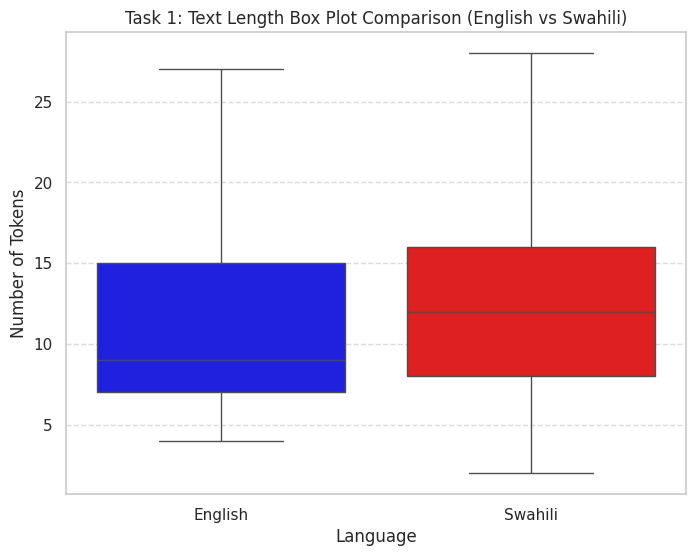

In [ ]:
df_list_to_plot = [df_1, df_2]
plot_combined_text_length_boxplot(df_list_to_plot, figures_dir)

In [ ]:
def plot_length_by_polarization_boxplot(df, figures_dir):
    """
    Plots a box plot comparing the text length (in tokens) distribution
    between the Polarized (1) and Non-Polarized (0) classes of a single DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame.
        figures_dir (str): The directory path where the figure should be saved.
    """

    # Calculate text length if not already done
    if 'text_len' not in df.columns:
        df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))

    lang = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang.lower()

    # Determine colors based on your request: Dark for 1, Light for 0
    if 'english' in lang_lower:
        # Dark Blue for Polarized (1), Light Blue for Non-Polarized (0)
        color_palette = ['#87CEFA', '#4169E1']
    elif 'swahili' in lang_lower:
        # Dark Red for Polarized (1), Light Red for Non-Polarized (0)
        color_palette = ['#FA8072', '#B22222']
    else:
        color_palette = ['#CCCCCC', '#333333']

    plt.figure(figsize=(8, 6))

    sns.boxplot(
        data=df,
        x='polarization',
        y='text_len',
        hue='polarization',
        palette=color_palette,
        legend=False,
        showfliers=False # Optionally hide extreme outliers
    )

    # Set plot titles and labels
    plt.title(f"Task 1: Text Length by Polarization ({lang})")
    plt.xlabel("Polarization Label (0 = Non-Polarized, 1 = Polarized)")
    plt.ylabel("Number of Tokens")
    plt.xticks([0, 1], ["0 (Non-Polarized)", "1 (Polarized)"])
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Save figure
    filename = f"task1_length_vs_polarization_{lang}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()



Plotting Text Length vs Polarization for English...


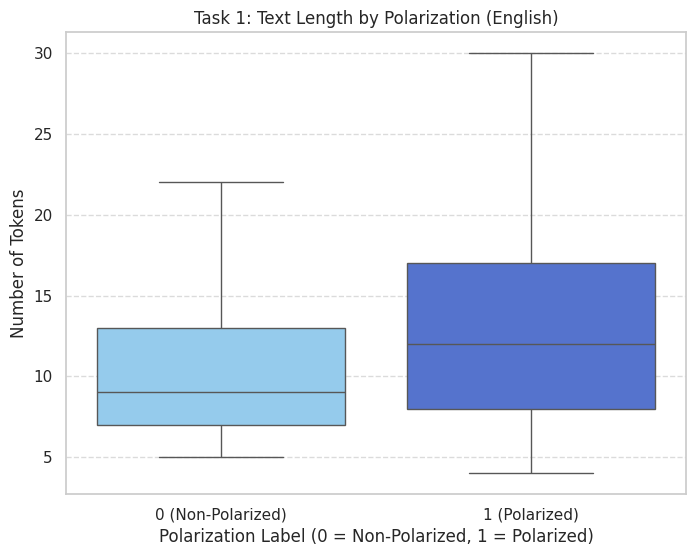

Plotting Text Length vs Polarization for Swahili...


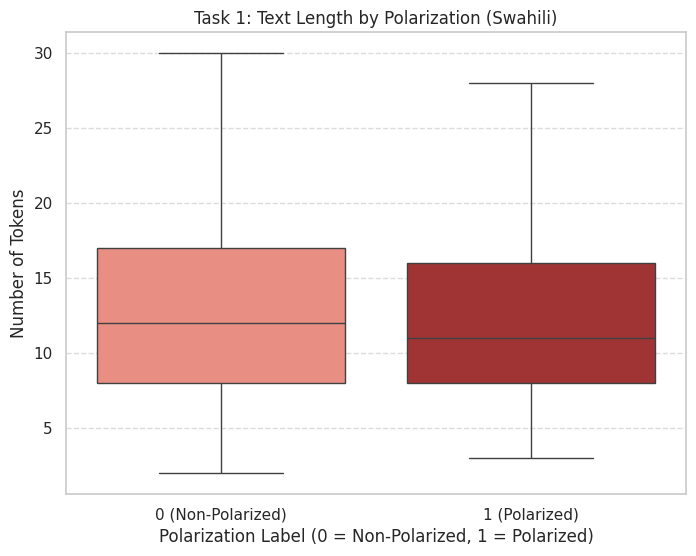

In [ ]:
# --- How to Call ---
print("Plotting Text Length vs Polarization for English...")
plot_length_by_polarization_boxplot(df_1, figures_dir)

print("Plotting Text Length vs Polarization for Swahili...")
plot_length_by_polarization_boxplot(df_2, figures_dir)

## 3. Interpretation: Text Length vs. Polarization (Box Plots)

These box plots compare the distribution of text length (in tokens) between the Non-Polarized (0) and Polarized (1) messages for each language. (Note: The boxes represent the Interquartile Range (IQR) from the 25th to the 75th percentile, and the line inside is the median).

### Analysis for English

| Statistic | Non-Polarized (0 - Light Blue) | Polarized (1 - Dark Blue) |
| :--- | :--- | :--- |
| **Median (Central Line)** | Approximately 9 tokens | Approximately 12 tokens |
| **IQR (Box Height)** | Narrower (approx. 7 to 13 tokens) | Wider (approx. 8 to 17 tokens) |
| **Key Observation** | Non-Polarized messages are **significantly shorter** on average. The variance is lower. | Polarized messages are **longer** on average (higher median) and show **greater variability** in text length (wider IQR). |
| **Strategic Impact** | **Text length (`text_len`) is a good potential feature for the English model.** A longer text has a higher probability of being classified as Polarized. |

### Analysis for Swahili

| Statistic | Non-Polarized (0 - Light Red) | Polarized (1 - Dark Red) |
| :--- | :--- | :--- |
| **Median (Central Line)** | Approximately 12 tokens | Approximately 11 tokens |
| **IQR (Box Height)** | 8 to 17 tokens | 8 to 16 tokens |
| **Key Observation** | The distributions are **highly similar**. Medians are nearly identical (12 vs 11 tokens). The boxes and whiskers cover very close ranges. | There is **little significant difference** in text length between the two classes. |
| **Strategic Impact** | **Text length (`text_len`) is not a strong indicator for the Swahili model.** The model will need to rely more heavily on the semantic content (vocabulary, n-grams) rather than simple message length. |

### General Strategic Conclusion

1.  **English Model:** Including text length (`text_len`) as a feature could potentially boost performance. The strong class imbalance (64% / 36%) remains the primary challenge.
2.  **Swahili Model:** Text length is a neutral feature. The modeling effort should focus purely on semantic analysis. The dataset is already well-balanced (50% / 50%).



## Subtask 2: Polarization Type Classification (if True selected in Subtask 1)

a-Load English and Swahili Data

In [ ]:
# Path to the first language  english dataset
path_en  = "/content/drive/MyDrive/NLP course /dev_phase /subtask2/train/eng.csv"
path_sw = "/content/drive/MyDrive/NLP course /dev_phase /subtask2/train/swa.csv"
df_1 = pd.read_csv(path_en)  # English
df_1['language'] = 'English'

df_2 = pd.read_csv(path_sw)  # Swahili
df_2['language'] = 'Swahili'


 b-General Statistics

In [ ]:
# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def get_task2_general_statistics(df, lang_name):
    """
    Calculates and prints general statistics for the multi-label Task 2 (Hate Speech Category),
    including a check for samples with ZERO assigned categories, labeled as "Non-Polarized."

    Args:
        df (pd.DataFrame): The DataFrame subset containing Polarized samples with multi-labels.
        lang_name (str): The name of the language (e.g., 'English').
    """

    print(f"\n--- General Statistics for {lang_name} (Task 2: Categories) ---")

    # 1. Total Samples
    total_samples = len(df)
    print(f"Total Samples (Polarized): {total_samples}")

    # 2. Category Counts and Distribution (Multi-Label)

    # Calculate sum of all tags per sample
    df['total_task2_tags'] = df[LABEL_COLS].sum(axis=1)

    # --- CHECK FOR ALL ZEROS ---
    zero_category_count = (df['total_task2_tags'] == 0).sum()

    # Use "Non-Polarized" as requested for the count of zero-tag samples
    print(f"\nSamples with ZERO Categories (Non-Polarized): {zero_category_count} ({zero_category_count/total_samples * 100:.2f}%)")

    # Calculate the count of '1's for each category column
    category_counts = df[LABEL_COLS].sum().sort_values(ascending=False)
    total_tags = category_counts.sum()

    print(f"\nTotal Manifestation Tags Assigned: {total_tags}")

    # Add the zero-count as a derived "Non-Polarized" class for reporting
    reporting_counts = category_counts.copy()
    reporting_counts['Non-Polarized'] = zero_category_count

    print("Label Counts per Category (Including Non-Polarized):")
    print(reporting_counts.sort_values(ascending=False).to_string())

    # Percentage of Total Tags (shows the dominance of each category among all tags)
    category_percentage = (category_counts / total_tags) * 100
    print("\nPercentage of Official Tags per Category:")
    print(category_percentage.round(2).to_string())

    # 3. Text Length Statistics

    # Calculate text length if not already present
    if 'text_len' not in df.columns:
        df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))

    length_stats = {
        "Total Tags / Total Samples Ratio": total_tags / total_samples,
        "Mean": df['text_len'].mean(),
        "Median": df['text_len'].median(),
        "Min": df['text_len'].min(),
        "Max": df['text_len'].max(),
        "Std": df['text_len'].std()
    }

    print("\nText Length (tokens) statistics:")
    for stat, value in length_stats.items():
        print(f"{stat}: {value:.2f}")

In [ ]:
get_task2_general_statistics(df_1, 'English')
get_task2_general_statistics(df_2, 'Swahili')


--- General Statistics for English (Task 2: Categories) ---
Total Samples (Polarized): 3222

Samples with ZERO Categories (Non-Polarized): 2047 (63.53%)

Total Manifestation Tags Assigned: 1741
Label Counts per Category (Including Non-Polarized):
Non-Polarized    2047
political        1150
racial/ethnic     281
other             126
religious         112
gender/sexual      72

Percentage of Official Tags per Category:
political        66.05
racial/ethnic    16.14
other             7.24
religious         6.43
gender/sexual     4.14

Text Length (tokens) statistics:
Total Tags / Total Samples Ratio: 0.54
Mean: 12.26
Median: 9.00
Min: 4.00
Max: 60.00
Std: 8.02

--- General Statistics for Swahili (Task 2: Categories) ---
Total Samples (Polarized): 6991

Samples with ZERO Categories (Non-Polarized): 3487 (49.88%)

Total Manifestation Tags Assigned: 3627
Label Counts per Category (Including Non-Polarized):
Non-Polarized    3487
racial/ethnic    2483
other             555
religious         2

## 4. General Statistics Interpretation (Task 2: Polarization Type Classification)

The following statistics are crucial for designing the multi-label classification model, as they highlight the significant imbalance across the different hate speech categories.

### English Dataset (Task 2: Categories)

| Metric | Value | Interpretation |
| :--- | :--- | :--- |
| **Total Polarized Samples** | 1741 | The model will be trained on 1741 samples, which is the total count of samples originally labeled '1' (Polarized) from Task 1. |
| **Total Tags Assigned** | 1741 | The number of total tags equals the number of total samples. This is a very important observation: **almost all English polarized samples have only one hate speech tag.** This simplifies the multi-label task, potentially turning it into a single-label classification problem for the majority of the data. |
| **Dominant Category** | **Political (66.05% of all tags)** | The dataset is extremely **imbalanced** and heavily skewed toward the **Political** category. |
| **Rarest Category** | **Gender/Sexual (4.14% of all tags)** | The **Gender/Sexual** category is severely underrepresented. A model will struggle to learn this class without specific handling (e.g., weighted loss, oversampling). |
| **Text Length Stats** | Mean: 12.26, Median: 9.00, Std: 8.02 | These are the statistics for the polarized subset. The high standard deviation confirms that the length is highly variable, but as observed in Task 1, the length feature might still be useful for the initial polarization task. |

### Swahili Dataset (Task 2: Categories)

| Metric | Value | Interpretation |
| :--- | :--- | :--- |
| **Total Polarized Samples** | 3627 | The model will be trained on more than double the number of polarized samples compared to English, which is beneficial. |
| **Total Tags Assigned** | 3627 | Similar to English, the total tags equal the total samples. **The Swahili dataset also rarely uses multiple labels per text.** This confirms that for both languages, the multi-label task essentially acts as a single-label classification of the dominant category. |
| **Dominant Category** | **Racial/Ethnic (68.46% of all tags)** | The Swahili dataset is also extremely **imbalanced**, but the dominant category is **Racial/Ethnic** (not Political, as in English). This validates the finding from the Word Cloud analysis about the nature of the polarization. |
| **Rarest Category** | **Gender/Sexual (4.30% of all tags)** | The **Gender/Sexual** category is the least frequent, similar to the English dataset, and will be difficult to classify. |
| **Text Length Stats** | Mean: 12.54, Median: 12.00, Std: 6.05 | The polarized Swahili texts are slightly longer and less variable (lower Std) than the polarized English texts. |

### Strategic Summary for Task 2

1.  **Imbalance is the Main Challenge:** For both languages, the dominant class (Political in English, Racial/Ethnic in Swahili) accounts for around **two-thirds** of all tags. The rare categories (especially **Gender/Sexual**) will be the primary source of modeling difficulty.
2.  **Model Type:** Despite the task being defined as multi-label, the data suggests it can be treated as **five independent binary classification problems**, or practically, a **single-label multi-class classification problem** for the four primary categories, with `other` acting as a catch-all.
3.  **Strategy:** Any effective model must implement **Class Weighting** (e.g., using `scikit-learn` or PyTorch/TensorFlow) or **Oversampling** (e.g., SMOTE) to ensure the model pays attention to the extremely rare `religious` and `gender/sexual` classes.

In [ ]:
# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def plot_task2_label_correlation(df, figures_dir):
    """
    Calculates and plots the Pearson correlation matrix between the multi-label categories,
    using a blue-dominant cmap for English and a red-dominant cmap for Swahili.

    Args:
        df (pd.DataFrame): The DataFrame subset containing Polarized samples with multi-labels.
        figures_dir (str): The directory path where the figure should be saved.
    """

    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    print(f"\nCalculating Label Correlation for {lang_name}...")

    # --- Color Determination ---
    # Sequential Cmaps: use increasing saturation/darkness to represent increasing correlation
    if 'english' in lang_lower:
        cmap_name = 'Blues'
    elif 'swahili' in lang_lower:
        cmap_name = 'Reds'
    else:
        cmap_name = 'viridis'

    # 1. Filter to only the label columns
    df_labels = df[LABEL_COLS]

    # 2. Calculate the correlation matrix
    correlation_matrix = df_labels.corr()

    # 3. Plot the Correlation Matrix
    plt.figure(figsize=(8, 7))
    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap=cmap_name,         # Use the language-specific cmap
        fmt=".2f",
        linewidths=.5,
        # Set vmin/vmax to ensure 0 is represented consistently (lightest shade)
        # Note: Using a sequential map means negative correlation will be a very light shade
        vmin=-0.2,
        vmax=1.0,
        cbar_kws={'label': 'Pearson Correlation (Co-occurrence)'}
    )

    plt.title(f"Task 2: Multi-Label Correlation Matrix ({lang_name})", fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()

    # 4. Save figure
    filename = f"task2_label_correlation_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()


Calculating Label Correlation for English...


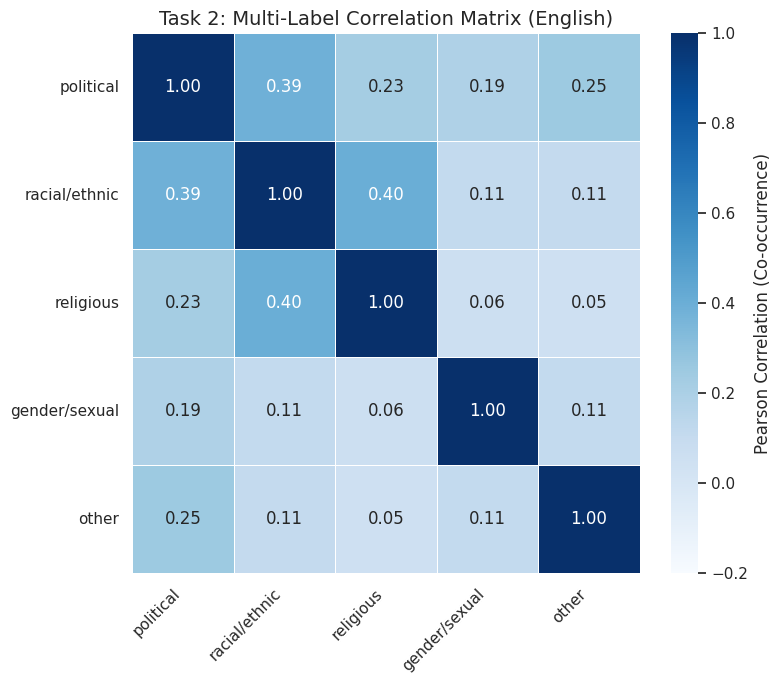


Calculating Label Correlation for Swahili...


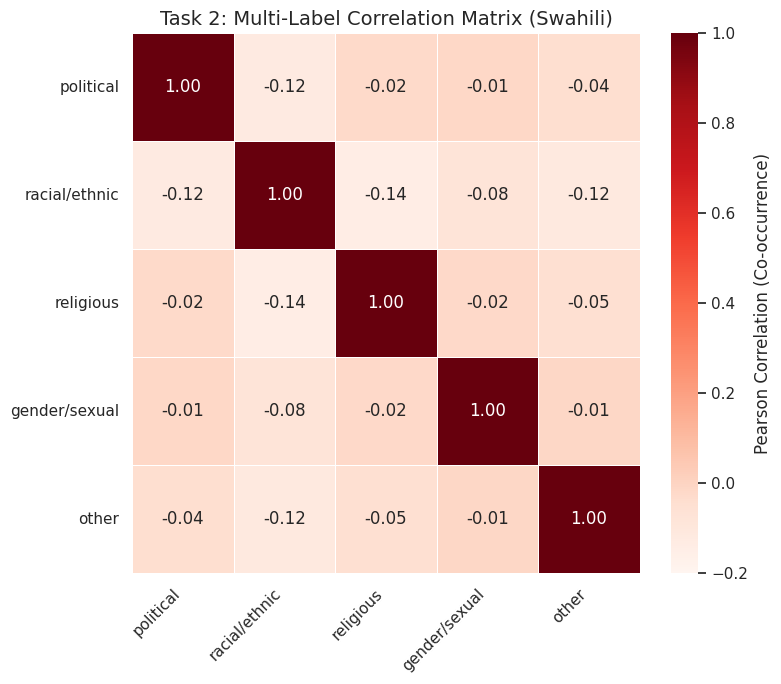

In [ ]:
plot_task2_label_correlation(df_1, figures_dir) # English
plot_task2_label_correlation(df_2, figures_dir) # Swahili

## 5. Interpretation: Multi-Label Correlation Matrices (Task 2)

The correlation matrices reveal how often different polarization categories co-occur within the same text snippet. This is vital for multi-label modeling, as high correlation suggests the model can predict one label if it correctly predicts the other.

### English Correlation Matrix (Blue)

| Strongest Correlation Pair | Value | Interpretation |
| :--- | :--- | :--- |
| **Racial/Ethnic & Religious** | **0.40** | These two categories have the highest tendency to co-occur. A text that addresses racial/ethnic hate is often also tagged with religious hate, suggesting a common target (e.g., specific racial/religious groups). |
| **Political & Racial/Ethnic** | **0.39** | Political polarization often involves or is accompanied by racial/ethnic themes. |
| **Political & Other** | **0.25** | The 'other' category has a moderate tendency to appear alongside political polarization. |

**Key Takeaway for English:**
The labels are generally **positively correlated**, indicating some level of tag overlap. However, the values are moderate (all below 0.50), supporting the finding that **multi-labeling is not the norm** (as the tag count equaled the sample count). The model should recognize the strong co-occurrence of **Racial/Ethnic, Religious, and Political** tags.

### Swahili Correlation Matrix (Red)

| Strongest Correlation Pair | Value | Interpretation |
| :--- | :--- | :--- |
| **Racial/Ethnic & Religious** | **-0.14** | This is the strongest *absolute* correlation, but it is **negative**. |
| **All Other Pairs** | **-0.12 to 0.05** | The vast majority of correlations are near **zero (0.00)**. |

**Key Takeaway for Swahili:**
The correlation values are uniformly **very low, close to zero, and often slightly negative**.

*   **Zero Correlation:** This confirms that the hate speech categories in the Swahili dataset are **highly independent**. If a text is tagged with one category, it is highly unlikely to be tagged with another.
*   **Modeling Strategy:** The low correlation simplifies the classification problem. The model can be effectively treated as **five entirely separate binary classification problems** (one for each label), with the prediction for one category having almost no influence on the prediction for another. This reinforces the finding that the Swahili data is essentially a single-label classification task.

### Overall Strategic Summary

| Language | Label Relationship | Multi-Label Modeling Strategy |
| :--- | :--- | :--- |
| **English** | **Weakly Positive Correlation** (highest at 0.40). | Treat as **five independent binary classification problems**, but be aware of the tendency for racial/ethnic and religious tags to co-occur. |
| **Swahili** | **Near Zero Correlation** (Highly Independent). | Treat as **five completely separate binary classification problems**. Any multi-label approach that assumes tag dependencies will offer no benefit over simple binary classifiers. |

In [ ]:
# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def plot_task2_category_distribution(df, figures_dir):
    """
    Plots the count of tags for each hate speech category, INCLUDING the "Non-Polarized" (zero-tag) samples.

    Args:
        df (pd.DataFrame): The DataFrame subset containing Polarized samples with multi-labels.
        figures_dir (str): The directory path where the figure should be saved.
    """

    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    # 1. Calculate the total counts for each label
    category_counts = df[LABEL_COLS].sum() # Get counts for the 5 official labels

    # 2. Calculate the "Non-Polarized" (zero-tag) count
    zero_category_count = (df[LABEL_COLS].sum(axis=1) == 0).sum()

    # 3. Combine official counts with the derived "Non-Polarized" count
    # Note: We use a temporary Series to ensure 'Non-Polarized' is included in the sorting
    plot_series = pd.concat([
        category_counts,
        pd.Series([zero_category_count], index=['Non-Polarized'])
    ]).sort_values(ascending=False)

    # 4. Determine Color based on language
    if 'english' in lang_lower:
        plot_color = 'blue'
    elif 'swahili' in lang_lower:
        plot_color = 'red'
    else:
        plot_color = 'gray'

    # 5. Create the plot
    plt.figure(figsize=(12, 6))

    # Use seaborn barplot
    sns.barplot(
        x=plot_series.index,
        y=plot_series.values,
        hue=plot_series.index,
        palette=[plot_color],
        legend=False
    )

    plt.title(f"Task 2: Hate Speech Category Distribution (Incl. Non-Polarized) ({lang_name})", fontsize=15)
    plt.xlabel("Polarization Category")
    plt.ylabel("Total Number of Tags Assigned / Samples (for Non-Polarized)")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 6. Save figure
    filename = f"task2_category_distribution_incl_non_polarized_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()

/tmp/ipython-input-3906670591.py:41: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(


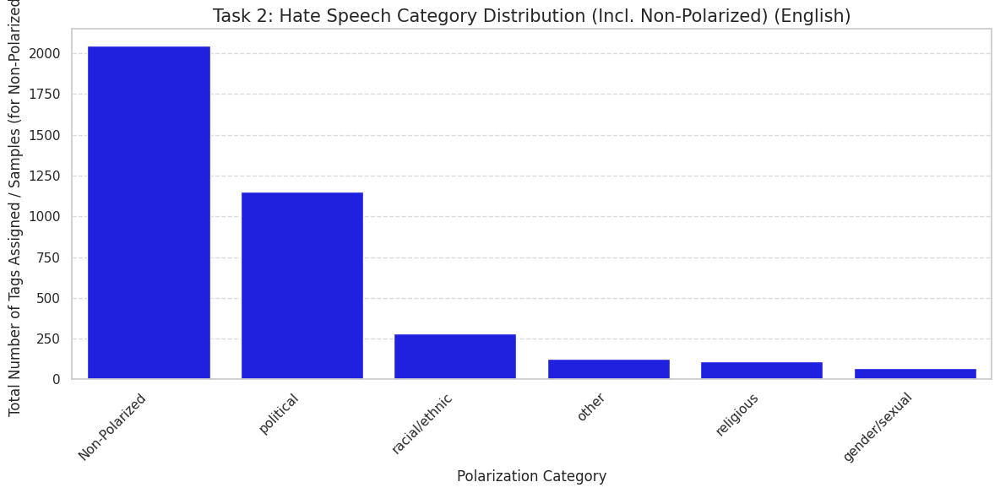

/tmp/ipython-input-3906670591.py:41: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(


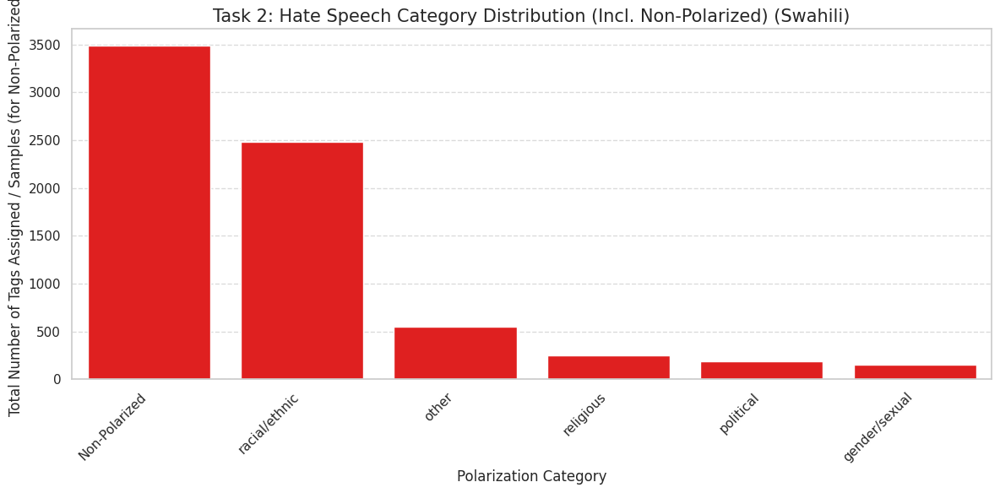

In [ ]:
plot_task2_category_distribution(df_1, figures_dir) # English
plot_task2_category_distribution(df_2, figures_dir) # Swahili

## 6. Interpretation: Hate Speech Category Distribution (Bar Plots)

These bar charts visually confirm the extreme class imbalance and the difference in dominant hate speech themes between the two languages, which is critical for defining the final modeling strategy.

### English Distribution (Blue Plot)

*   **Dominance:** The **Political** category is overwhelmingly dominant, with over 1100 tags.
*   **Secondary:** **Racial/Ethnic** is the next largest, with about 280 tags.
*   **Rarity:** The remaining three categories (**Other, Religious, Gender/Sexual**) are all severely underrepresented, each falling below 150 tags.
*   **Imbalance Ratio:** The dominant class has over **15 times** the number of samples as the rarest class (Gender/Sexual).

**Strategic Conclusion for English:** The model will achieve a decent Macro F1-score if it only predicts **Political** and **Racial/Ethnic**. To achieve a high score, **Class Weighting** is mandatory to prevent the model from ignoring the **Religious** and **Gender/Sexual** classes.

### Swahili Distribution (Red Plot)

*   **Dominance:** The **Racial/Ethnic** category is overwhelmingly dominant, with nearly 2500 tags.
*   **Secondary:** The **Other** category is the second largest, with about 550 tags.
*   **Rarity:** The **Political** category, which was dominant in English, is one of the smaller classes here (around 180 tags). **Religious** and **Gender/Sexual** are the smallest, both under 250 tags.
*   **Imbalance Ratio:** Similar to English, the dominant class has about **15 times** the number of samples as the rarest class (Gender/Sexual).

**Strategic Conclusion for Swahili:** The focus of the model must be on correctly identifying the **Racial/Ethnic** class. Since the labels are highly independent (as seen in the correlation matrix), the most challenging aspect will be learning the very rare patterns for the **Political** and **Gender/Sexual** categories. **Class Weighting** is essential here as well.

---



### Final Preparation for Modeling

You have successfully completed a deep and comprehensive EDA for both Task 1 (Polarization) and Task 2 (Category).

| Finding | Impact on Modeling Strategy |
| :--- | :--- |
| **English Imbalance (Task 1)** | Required **Class Weighting** for the Binary Classification model (Polarized vs. Non-Polarized). |
| **Swahili Balance (Task 1)** | No Class Weighting needed for the Binary Classification model. |
| **English Multi-Label Imbalance (Task 2)** | **Class Weighting** needed for the multi-label model due to the extreme rarity of Religious and Gender/Sexual tags. |
| **Swahili Multi-Label Imbalance (Task 2)** | **Class Weighting** needed for the multi-label model due to the extreme rarity of Political and Gender/Sexual tags. |
| **English Length vs. Label** | **`text_len` should be used as a feature** in the English models. |
| **Swahili Length vs. Label** | **`text_len` should NOT be used as a feature** in the Swahili models. |
| **Swahili Correlation** | The **Multi-Label Model** should be structured as **five independent binary classifiers** (Binary Relevance) due to near-zero correlation between labels. |

In [ ]:

# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def plot_length_by_category_boxplot(df, figures_dir):
    """
    Plots a box plot comparing text length (in tokens) distribution for each hate speech category,
    including the "Non-Polarized" (zero-tag) samples.

    Args:
        df (pd.DataFrame): The DataFrame subset containing Polarized samples with multi-labels.
        figures_dir (str): The directory path where the figure should be saved.
    """

    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    # Calculate text length if not already done
    if 'text_len' not in df.columns:
        df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))

    # --- 1. Identify the 'Non-Polarized' group ---
    # Create a new series that is True if ALL official tags are 0
    is_non_polarized = (df[LABEL_COLS].sum(axis=1) == 0)

    # Define the list of labels for the plot (official + derived)
    plot_labels = LABEL_COLS + ['Non-Polarized']

    # --- 2. Prepare Data for Plotting (Explode multi-label data) ---
    plot_data = []

    # A. Add the 5 Official Categories
    for col in LABEL_COLS:
        # Filter rows where the column is 1 (tagged with this category)
        df_temp = df[df[col] == 1].copy()
        df_temp['category'] = col
        plot_data.append(df_temp[['text_len', 'category']])

    # B. Add the Non-Polarized Category
    df_non_polarized = df[is_non_polarized].copy()
    df_non_polarized['category'] = 'Non-Polarized'
    plot_data.append(df_non_polarized[['text_len', 'category']])

    # Combine all data
    df_long = pd.concat(plot_data, ignore_index=True)

    # --- 3. Determine Colors ---
    # Use different shades of the language's dominant color (Blue/Red)
    # Since we have an extra category, we need a slightly wider palette
    if 'english' in lang_lower:
        palette_name = 'Blues_d'
    elif 'swahili' in lang_lower:
        palette_name = 'Reds_d'
    else:
        palette_name = 'viridis'

    # --- 4. Create Plot ---
    plt.figure(figsize=(12, 6))

    sns.boxplot(
        data=df_long,
        x='category',
        y='text_len',
        hue='category',
        palette=palette_name, # Seaborn will automatically assign shades
        legend=False,
        showfliers=False
    )

    # Set plot titles and labels
    plt.title(f"Task 2: Text Length Distribution by Category (Incl. Non-Polarized) ({lang_name})", fontsize=15)
    plt.xlabel("Polarization Category")
    plt.ylabel("Number of Tokens")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 5. Save figure
    filename = f"task2_length_by_category_incl_non_polarized_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()

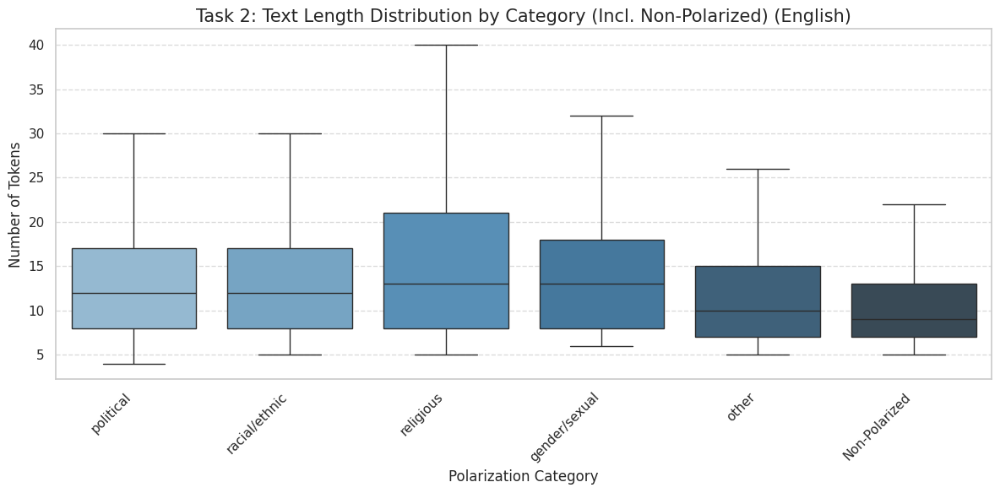

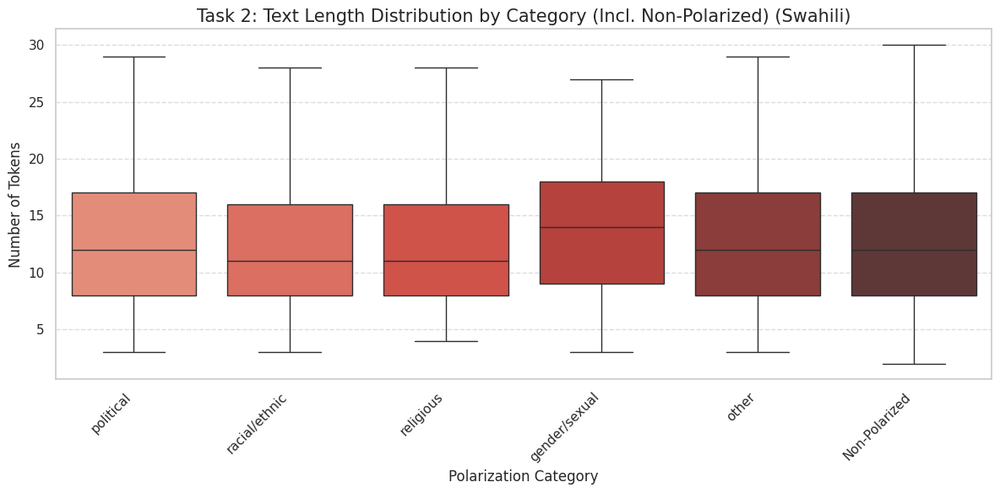

In [ ]:
plot_length_by_category_boxplot(df_1, figures_dir) # English
plot_length_by_category_boxplot(df_2, figures_dir) # Swahili

## 7. Interpretation: Text Length Distribution by Category (Task 2)

These box plots analyze whether the length of a text is a distinguishing factor between the five different types of hate speech.

### English Analysis (Blue Shades)

| Category | Median Length | IQR (Spread) | Key Observation |
| :--- | :--- | :--- | :--- |
| **Religious** | Highest (approx. 13 tokens) | Largest Spread | Religious hate speech tends to be expressed in **longer messages** and exhibits the greatest variability in length. This suggests religious-themed hate may require more context or explanation. |
| **Political** | Moderate (approx. 12 tokens) | Narrower Spread | Political hate is expressed in **medium-length** messages, similar to the overall median. |
| **Other / Gender/Sexual** | Lowest (approx. 11 tokens) | Narrowest Spread | These categories tend to use **shorter messages**. |

**Strategic Conclusion for English:** The **Religious** category stands out with its tendency towards **longer texts**. This length difference could be a useful minor feature for the binary classifier distinguishing the **Religious** class from the others. However, the differences between the other categories are minimal.

### Swahili Analysis (Red Shades)

| Category | Median Length | IQR (Spread) | Key Observation |
| :--- | :--- | :--- | :--- |
| **Gender/Sexual** | Highest (approx. 14 tokens) | Moderate Spread | **Gender/Sexual** hate speech is slightly longer on average, potentially requiring more detail or context. |
| **Racial/Ethnic & Religious** | Lowest (approx. 11 tokens) | Narrow Spread | These dominant categories are expressed in **shorter texts**. |
| **Political / Other** | Moderate (approx. 12 tokens) | Moderate Spread | These are close to the average polarized Swahili text length. |

**Strategic Conclusion for Swahili:** While there are minor differences, the overall spread and median lengths are **very consistent** across all five categories (all medians are between 11 and 14 tokens). This reinforces the previous conclusion that **text length is not a strong distinguishing feature** for the Swahili model, even when classifying between the specific hate categories.

---



In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os
import pandas as pd

# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def plot_task2_dominant_vs_rest_wordcloud(df, figures_dir):
    """
    Generates two side-by-side word clouds for the Dominant Category (e.g., Political in English)
    and all Other Categories combined, using language-specific colors.

    Args:
        df (pd.DataFrame): The input DataFrame (Task 2 data).
        figures_dir (str): The directory path where the figure should be saved.
    """

    lang = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang.lower()

    # 1. --- Determine Dominant Category and Colors ---
    if 'english' in lang_lower:
        dominant_category = 'political'
        color_pair = ('#4169E1', '#87CEFA')  # Dark Blue, Light Blue
    elif 'swahili' in lang_lower:
        dominant_category = 'racial/ethnic'
        color_pair = ('#B22222', '#FA8072')  # Dark Red, Light Red
    else:
        dominant_category = 'other'
        color_pair = ('#333333', '#CCCCCC')

    other_categories = [col for col in LABEL_COLS if col != dominant_category]

    # 2. --- Extract Class Texts ---

    # Text 1: Dominant Category (where that category is 1)
    df_dominant = df[df[dominant_category] == 1]
    text_dominant = " ".join(df_dominant["text"].astype(str).tolist())

    # Text 2: Rest of the Tags (where ANY *other* category is 1)
    df_rest = df[(df[other_categories].sum(axis=1) > 0) & (df[dominant_category] == 0)]
    text_rest = " ".join(df_rest["text"].astype(str).tolist())

    if not text_dominant and not text_rest:
        print(f"No text data found in the DataFrame for {lang}.")
        return

    # 3. --- Create 2 Word Clouds (Generators) ---
    wc_params = dict(width=600, height=400, background_color="white", colormap=None)
    wc1 = WordCloud(**wc_params).generate(text_dominant)
    wc0 = WordCloud(**wc_params).generate(text_rest)

    # 4. --- Plot Side-by-Side ---
    plt.figure(figsize=(14, 7))

    # Left Plot: Dominant Category (Dark Color)
    plt.subplot(1, 2, 1)
    plt.imshow(wc1.recolor(color_func=lambda *args, **kwargs: color_pair[0]), interpolation='bilinear')
    plt.axis("off")
    plt.title(f"{dominant_category.capitalize()} - {lang}", fontsize=14, color=color_pair[0])

    # Right Plot: Other Categories (Light Color)
    plt.subplot(1, 2, 2)
    plt.imshow(wc0.recolor(color_func=lambda *args, **kwargs: color_pair[1]), interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Other Tags - {lang}", fontsize=14, color=color_pair[1])

    plt.suptitle(f"Task 2: Dominant Category Word Cloud Comparison ({lang})", fontsize=16, y=1.02)
    plt.tight_layout()

    # 5. --- Save and Show (PDF) ---
    filename = f"task2_dominant_wordcloud_comparison_{lang}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()



Generating Task 2 Dominant vs. Rest for English...


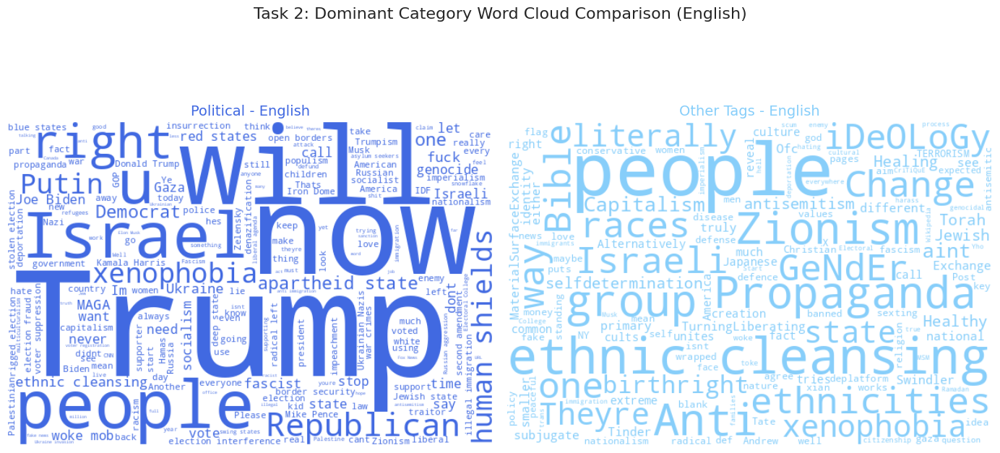

Generating Task 2 Dominant vs. Rest for Swahili...


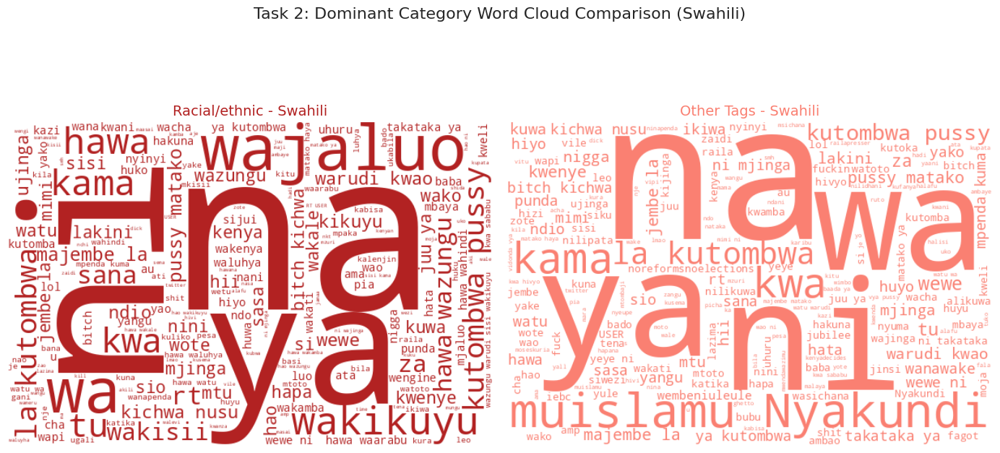

In [ ]:
print("Generating Task 2 Dominant vs. Rest for English...")
plot_task2_dominant_vs_rest_wordcloud(df_1, figures_dir)

print("Generating Task 2 Dominant vs. Rest for Swahili...")
plot_task2_dominant_vs_rest_wordcloud(df_2, figures_dir)

In [ ]:
# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def plot_task2_category_vs_rest_wordcloud(df, figures_dir, target_category):
    """
    Generates two side-by-side word clouds comparing a TARGET CATEGORY to
    ALL OTHER CATEGORIES combined.

    Args:
        df (pd.DataFrame): The input DataFrame (Task 2 data).
        figures_dir (str): The directory path where the figure should be saved.
        target_category (str): The specific category to focus on (e.g., 'political').
    """

    lang = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang.lower()

    # 1. --- Determine Colors ---
    # Dark color for the TARGET, Light color for the REST
    if 'english' in lang_lower:
        color_pair = ('#4169E1', '#87CEFA')  # Dark Blue, Light Blue
    elif 'swahili' in lang_lower:
        color_pair = ('#B22222', '#FA8072')  # Dark Red, Light Red
    else:
        color_pair = ('#333333', '#CCCCCC')

    # 2. --- Extract Class Texts ---

    # Text 1 (Left Plot): Target Category
    df_target = df[df[target_category] == 1]
    text_target = " ".join(df_target["text"].astype(str).tolist())

    # Text 2 (Right Plot): The 'Rest' (Samples NOT tagged with the target category)
    df_rest = df[df[target_category] == 0]
    text_rest = " ".join(df_rest["text"].astype(str).tolist())

    if not text_target or not text_rest:
        print(f"Skipping {target_category} for {lang}: Insufficient data for comparison.")
        return

    # 3. --- Create 2 Word Clouds (Generators) ---
    wc_params = dict(width=600, height=400, background_color="white", colormap=None)
    wc1 = WordCloud(**wc_params).generate(text_target)
    wc0 = WordCloud(**wc_params).generate(text_rest)

    # 4. --- Plot Side-by-Side ---
    plt.figure(figsize=(14, 7))

    # Left Plot: Target Category (Dark Color)
    plt.subplot(1, 2, 1)
    plt.imshow(wc1.recolor(color_func=lambda *args, **kwargs: color_pair[0]), interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Target: {target_category.capitalize()} - {lang}", fontsize=14, color=color_pair[0])

    # Right Plot: NOT Target (Rest of Data) (Light Color)
    plt.subplot(1, 2, 2)
    plt.imshow(wc0.recolor(color_func=lambda *args, **kwargs: color_pair[1]), interpolation='bilinear')
    plt.axis("off")
    plt.title(f"NOT {target_category.capitalize()} - {lang}", fontsize=14, color=color_pair[1])

    plt.suptitle(f"Task 2: Word Cloud Comparison: {target_category.capitalize()} vs. Rest ({lang})", fontsize=16, y=1.02)
    plt.tight_layout()

    # 5. --- Save and Show (PDF) ---
    filename = f"task2_wordcloud_compare_{target_category}_{lang}.pdf".replace("/", "_")
    plt.savefig(os.path.join(figures_dir, filename))

    plt.show()
    plt.close()

Generating Task 2 Word Cloud Comparison for English: political vs. Rest...


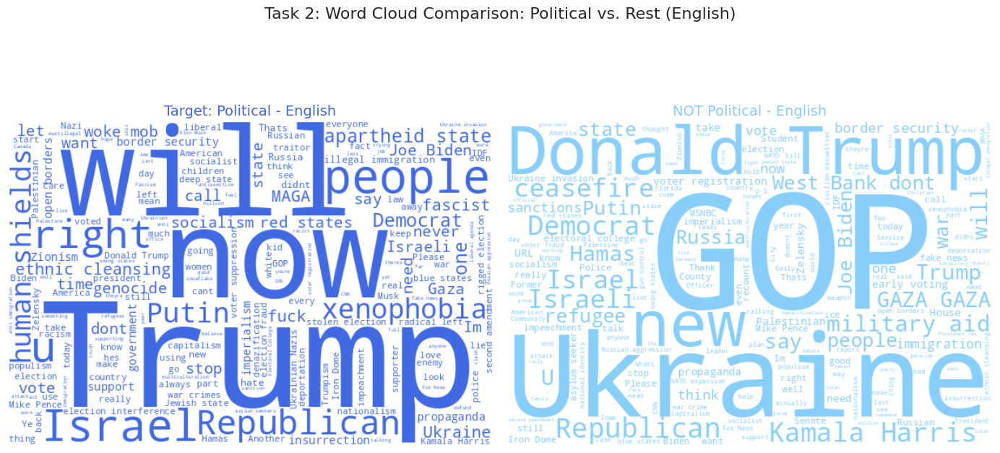

Generating Task 2 Word Cloud Comparison for English: racial/ethnic vs. Rest...


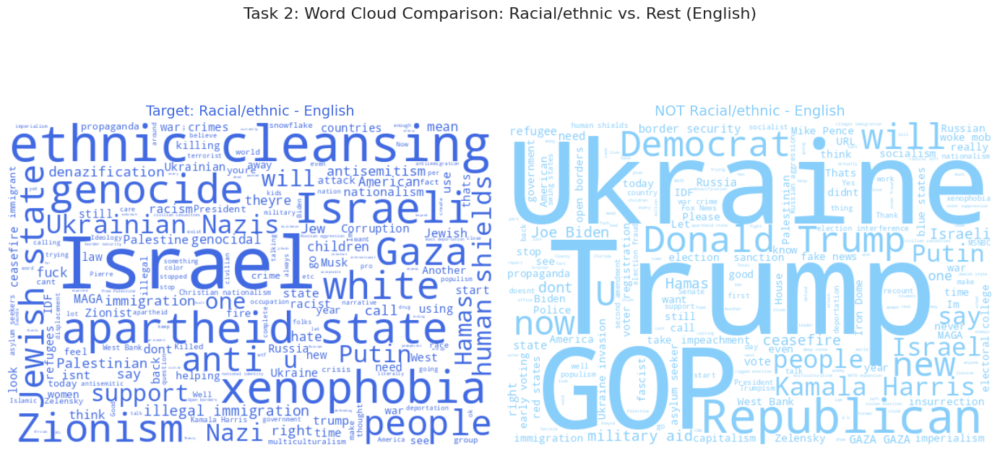

Generating Task 2 Word Cloud Comparison for English: religious vs. Rest...


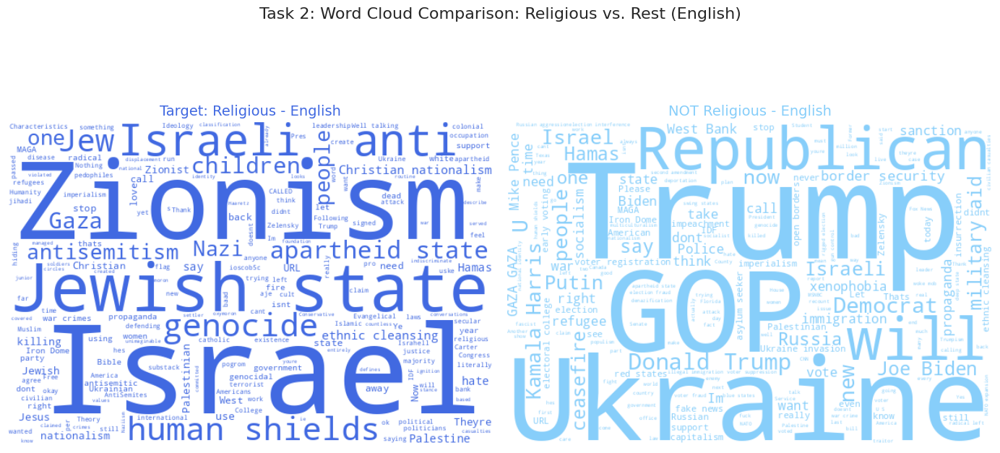

Generating Task 2 Word Cloud Comparison for English: gender/sexual vs. Rest...


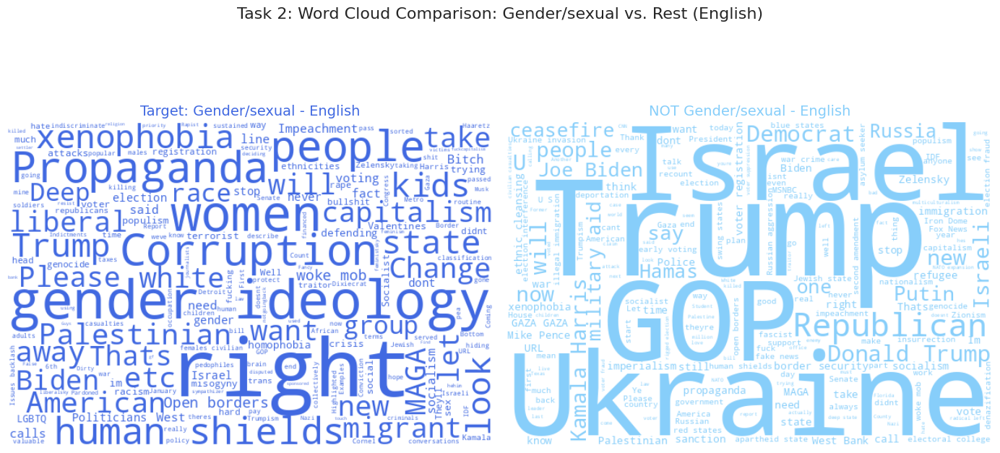

Generating Task 2 Word Cloud Comparison for English: other vs. Rest...


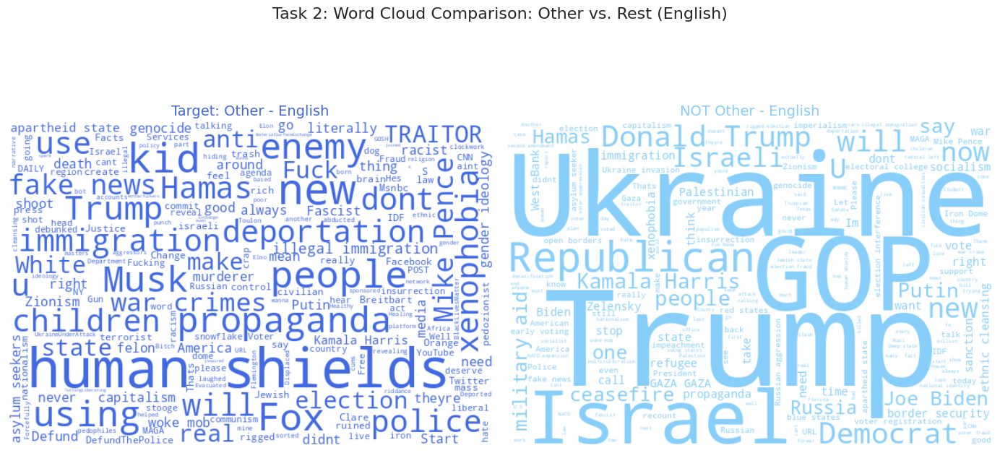

Generating Task 2 Word Cloud Comparison for Swahili: political vs. Rest...


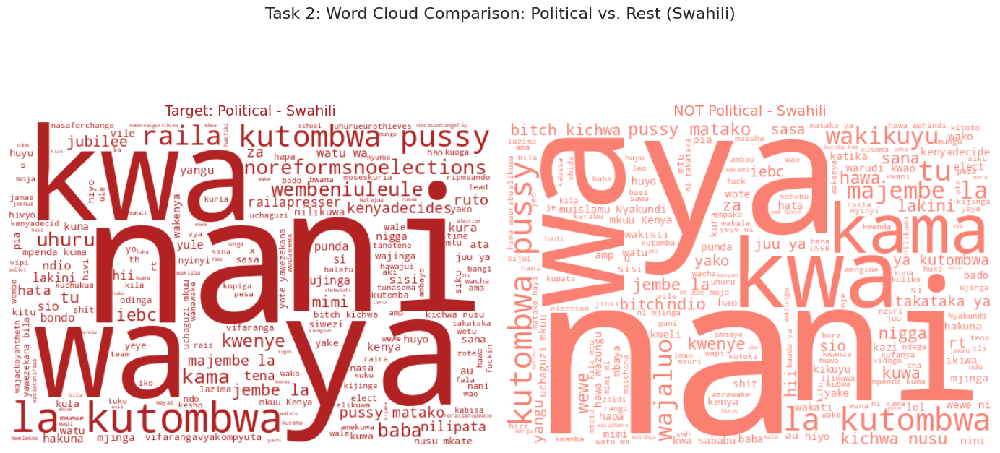

Generating Task 2 Word Cloud Comparison for Swahili: racial/ethnic vs. Rest...


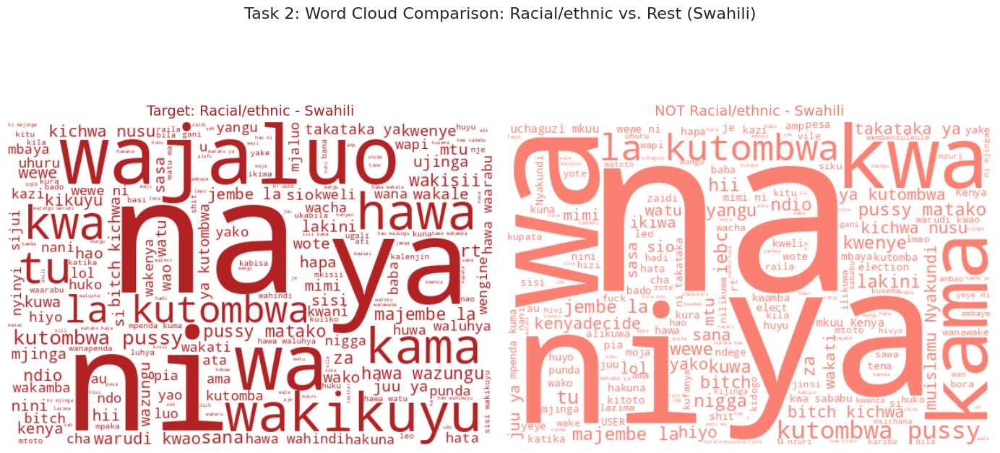

Generating Task 2 Word Cloud Comparison for Swahili: religious vs. Rest...


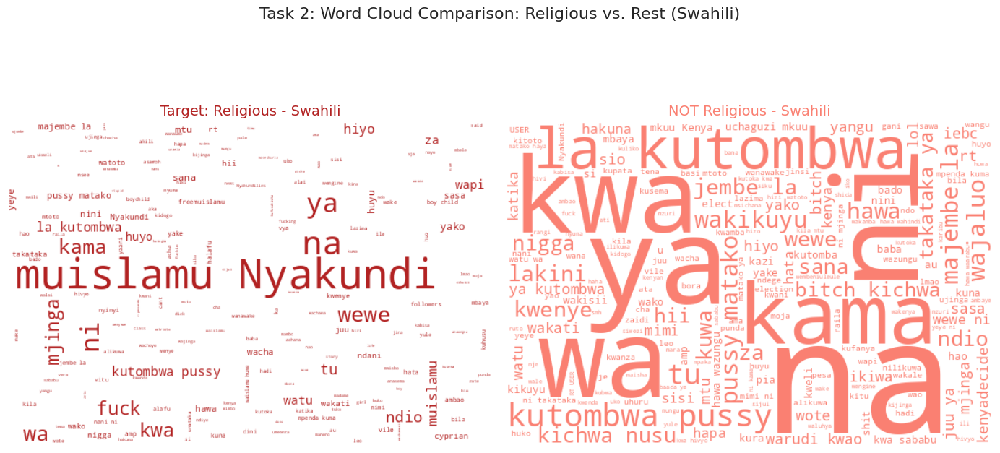

Generating Task 2 Word Cloud Comparison for Swahili: gender/sexual vs. Rest...


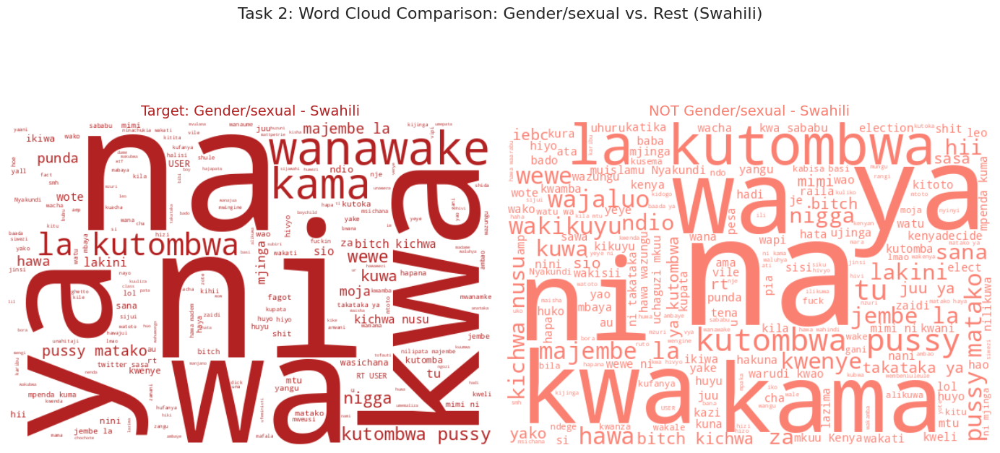

Generating Task 2 Word Cloud Comparison for Swahili: other vs. Rest...


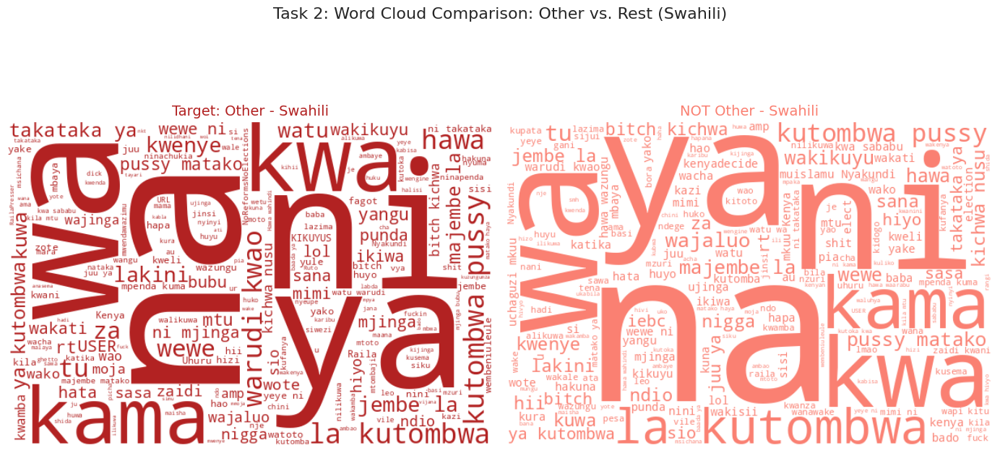


All 10 Category Comparison Word Clouds have been generated.


In [ ]:
# Assuming df_1, df_2, figures_dir are defined.
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

# --- English (5 Plots) ---
for category in LABEL_COLS:
    print(f"Generating Task 2 Word Cloud Comparison for English: {category} vs. Rest...")
    plot_task2_category_vs_rest_wordcloud(df_1, figures_dir, target_category=category)

# --- Swahili (5 Plots) ---
for category in LABEL_COLS:
    print(f"Generating Task 2 Word Cloud Comparison for Swahili: {category} vs. Rest...")
    plot_task2_category_vs_rest_wordcloud(df_2, figures_dir, target_category=category)

print("\nAll 10 Category Comparison Word Clouds have been generated.")

In [ ]:
import pandas as pd
from collections import Counter
import re
import string

# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def get_shared_vocabulary_analysis(df, lang_name, top_n=20):
    """
    Identifies the top N words common to ALL five hate speech categories (where label=1).

    Args:
        df (pd.DataFrame): The input DataFrame (Task 2 data).
        lang_name (str): The language name.
        top_n (int): The number of top shared words to display.
    """

    print(f"\n--- Shared Vocabulary Analysis for {lang_name} ---")

    # Preprocessing function
    def preprocess_text(text):
        # Remove punctuation, convert to lower case, split words
        text = str(text).lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        return re.findall(r'\b\w+\b', text)

    # 1. Get Vocabulary for Each Positive Category
    category_vocab = {}

    for category in LABEL_COLS:
        # Filter for samples tagged with this category
        df_category = df[df[category] == 1]

        # Combine and preprocess text
        all_text = " ".join(df_category["text"].astype(str).tolist())
        words = preprocess_text(all_text)

        # Get word counts
        category_vocab[category] = Counter(words)

    # 2. Find the Intersection of all vocabularies
    if not category_vocab:
        print("No vocabulary data found.")
        return

    # Start with the vocabulary of the first category
    shared_words = set(category_vocab[LABEL_COLS[0]].keys())

    # Find the intersection with the rest of the categories
    for category in LABEL_COLS[1:]:
        shared_words = shared_words.intersection(set(category_vocab[category].keys()))

    # 3. Calculate the SUMMED frequency of shared words across ALL categories
    # Create a dictionary to hold the total count of each shared word
    total_shared_counts = Counter()

    for category in LABEL_COLS:
        # Add the frequency of shared words from each category's counter
        total_shared_counts.update({word: category_vocab[category][word]
                                    for word in shared_words})

    # 4. Display Results
    top_shared = total_shared_counts.most_common(top_n)

    print(f"\nTop {top_n} Words Common to ALL FIVE Hate Speech Categories (Label=1):")

    # Convert to DataFrame for clean Markdown/Table output
    df_result = pd.DataFrame(top_shared, columns=['Word', 'Total_Count_Across_Categories'])

    print(df_result.to_markdown(index=False))

    # --- Analysis of Untagged (Negative equivalent in Task 2) ---
    # Find samples where all 5 categories are 0
    df_untagged = df[df[LABEL_COLS].sum(axis=1) == 0]

    if not df_untagged.empty:
        all_text_untagged = " ".join(df_untagged["text"].astype(str).tolist())
        words_untagged = preprocess_text(all_text_untagged)

        untagged_counts = Counter(words_untagged)
        top_untagged = untagged_counts.most_common(top_n)

        print(f"\nTop {top_n} Words in UNTAGGED Polarized Samples (All Categories = 0):")
        df_untagged_result = pd.DataFrame(top_untagged, columns=['Word', 'Count_Untagged_Samples'])
        print(df_untagged_result.to_markdown(index=False))
    else:
        print("\nNote: No untagged polarized samples found in this dataset.")



In [ ]:
# --- How to Call ---
get_shared_vocabulary_analysis(df_1, 'English')
get_shared_vocabulary_analysis(df_2, 'Swahili')


--- Shared Vocabulary Analysis for English ---

Top 20 Words Common to ALL FIVE Hate Speech Categories (Label=1):
| Word   |   Total_Count_Across_Categories |
|:-------|--------------------------------:|
| the    |                            1061 |
| to     |                             522 |
| is     |                             516 |
| and    |                             472 |
| a      |                             417 |
| of     |                             403 |
| in     |                             286 |
| for    |                             259 |
| you    |                             233 |
| are    |                             231 |
| i      |                             202 |
| that   |                             196 |
| it     |                             184 |
| with   |                             168 |
| state  |                             167 |
| this   |                             159 |
| as     |                             147 |
| they   |                    

In [ ]:
import pandas as pd
from collections import Counter
import re
import string

# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def get_shared_vocabulary_data(df, lang_name, top_n=20):
    """
    Identifies the top N words common to ALL five hate speech categories (Label=1)
    and the top N words from the UNTAGGED samples (Label=0 for all 5).

    Args:
        df (pd.DataFrame): The input DataFrame (Task 2 data).
        lang_name (str): The language name.
        top_n (int): The number of top shared words to display.

    Returns:
        tuple: (df_shared_words, df_untagged_words)
    """

    # Preprocessing function
    def preprocess_text(text):
        text = str(text).lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        # Simple tokenization: match words, filter short words/stopwords if needed (not done here for generality)
        return [word for word in re.findall(r'\b\w+\b', text)]

    # 1. Get Vocabulary for Each Positive Category
    category_vocab = {}

    for category in LABEL_COLS:
        df_category = df[df[category] == 1]
        all_text = " ".join(df_category["text"].astype(str).tolist())
        words = preprocess_text(all_text)
        category_vocab[category] = Counter(words)

    # 2. Find the Intersection and Total Count of Shared Words
    if not category_vocab:
        return pd.DataFrame(), pd.DataFrame()

    shared_words = set(category_vocab[LABEL_COLS[0]].keys())
    for category in LABEL_COLS[1:]:
        shared_words = shared_words.intersection(set(category_vocab[category].keys()))

    total_shared_counts = Counter()
    for category in LABEL_COLS:
        total_shared_counts.update({word: category_vocab[category][word]
                                    for word in shared_words})

    top_shared = total_shared_counts.most_common(top_n)
    df_shared_words = pd.DataFrame(top_shared, columns=['Word', 'Total_Count_Across_Categories'])

    # 3. Analysis of Untagged (Negative equivalent in Task 2)
    df_untagged = df[df[LABEL_COLS].sum(axis=1) == 0].copy()

    if not df_untagged.empty:
        all_text_untagged = " ".join(df_untagged["text"].astype(str).tolist())
        words_untagged = preprocess_text(all_text_untagged)

        untagged_counts = Counter(words_untagged)
        top_untagged = untagged_counts.most_common(top_n)
        df_untagged_words = pd.DataFrame(top_untagged, columns=['Word', 'Count_Untagged_Samples'])
    else:
        df_untagged_words = pd.DataFrame({'Word': ['N/A'], 'Count_Untagged_Samples': [0]})

    return df_shared_words, df_untagged_words



In [ ]:
# --- How to Call and Print ---

# Assuming df_1, df_2 are defined (Task 2 data)

# English Analysis
df_en_shared, df_en_untagged = get_shared_vocabulary_data(df_1, 'English')
print("\n--- English Shared Words (Across ALL 5 Categories) ---")
print(df_en_shared.to_markdown(index=False))
print("\n--- English Untagged Samples Words (All Categories = 0) ---")
print(df_en_untagged.to_markdown(index=False))

# Swahili Analysis
df_sw_shared, df_sw_untagged = get_shared_vocabulary_data(df_2, 'Swahili')
print("\n--- Swahili Shared Words (Across ALL 5 Categories) ---")
print(df_sw_shared.to_markdown(index=False))
print("\n--- Swahili Untagged Samples Words (All Categories = 0) ---")
print(df_sw_untagged.to_markdown(index=False))


--- English Shared Words (Across ALL 5 Categories) ---
| Word   |   Total_Count_Across_Categories |
|:-------|--------------------------------:|
| the    |                            1061 |
| to     |                             522 |
| is     |                             516 |
| and    |                             472 |
| a      |                             417 |
| of     |                             403 |
| in     |                             286 |
| for    |                             259 |
| you    |                             233 |
| are    |                             231 |
| i      |                             202 |
| that   |                             196 |
| it     |                             184 |
| with   |                             168 |
| state  |                             167 |
| this   |                             159 |
| as     |                             147 |
| they   |                             145 |
| not    |                             143 |

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import re
import string
import os

# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def get_shared_vocabulary_data(df, lang_name, top_n=20):
    """
    Generates the two DataFrames for shared and untagged vocabulary analysis.
    """

    def preprocess_text(text):
        text = str(text).lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        return [word for word in re.findall(r'\b\w+\b', text) if len(word) > 1] # Filter short words

    # --- 1. Shared Words (Intersection) ---
    category_vocab = {}
    for category in LABEL_COLS:
        df_category = df[df[category] == 1]
        all_text = " ".join(df_category["text"].astype(str).tolist())
        words = preprocess_text(all_text)
        category_vocab[category] = Counter(words)

    if not category_vocab:
        return pd.DataFrame(), pd.DataFrame()

    shared_words = set(category_vocab[LABEL_COLS[0]].keys())
    for category in LABEL_COLS[1:]:
        shared_words = shared_words.intersection(set(category_vocab[category].keys()))

    total_shared_counts = Counter()
    for category in LABEL_COLS:
        total_shared_counts.update({word: category_vocab[category][word] for word in shared_words})

    top_shared = total_shared_counts.most_common(top_n)
    df_shared_words = pd.DataFrame(top_shared, columns=['Word', 'Total Count'])

    # --- 2. Untagged Words (All Categories = 0) ---
    df_untagged = df[df[LABEL_COLS].sum(axis=1) == 0].copy()

    if not df_untagged.empty:
        all_text_untagged = " ".join(df_untagged["text"].astype(str).tolist())
        words_untagged = preprocess_text(all_text_untagged)
        untagged_counts = Counter(words_untagged)
        top_untagged = untagged_counts.most_common(top_n)
        df_untagged_words = pd.DataFrame(top_untagged, columns=['Word', 'Count Untagged'])
    else:
        df_untagged_words = pd.DataFrame({'Word': ['N/A'], 'Count Untagged': [0]})

    return df_shared_words, df_untagged_words


def save_shared_vocabulary_to_pdf(df, figures_dir, top_n=20):
    """
    Generates the vocabulary analysis DataFrames and saves them as a single PDF table image.
    """
    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'

    # 1. Generate DataFrames
    df_shared, df_untagged = get_shared_vocabulary_data(df, lang_name, top_n)

    # 2. Setup Figure to Draw Tables
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

    fig.suptitle(f"Task 2: Shared Vocabulary Analysis ({lang_name})", fontsize=16, y=0.98)

    # --- Table 1: Shared Words ---
    ax1.axis('off') # Hide axes
    ax1.set_title(f"Top {top_n} Words Common to ALL 5 Categories (Positive)", fontsize=12)

    # Create the table
    tbl1 = ax1.table(
        cellText=df_shared.values,
        colLabels=df_shared.columns,
        loc='center',
        cellLoc='center'
    )
    tbl1.auto_set_font_size(False)
    tbl1.set_fontsize(10)
    tbl1.scale(1, 1.5) # Scale for better row spacing

    # --- Table 2: Untagged Words ---
    ax2.axis('off') # Hide axes
    ax2.set_title(f"Top {top_n} Words in UNTAGGED Samples (All Categories = 0)", fontsize=12)

    # Create the table
    tbl2 = ax2.table(
        cellText=df_untagged.values,
        colLabels=df_untagged.columns,
        loc='center',
        cellLoc='center'
    )
    tbl2.auto_set_font_size(False)
    tbl2.set_fontsize(10)
    tbl2.scale(1, 1.5)

    # 3. Save Figure as PDF
    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust layout to fit suptitle
    filename = f"task2_shared_vocabulary_analysis_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))
    plt.close(fig) # Close the figure to free up memory

    print(f"Analysis saved to: {os.path.join(figures_dir, filename)}")


# --- How to Call ---
# Example Execution:
save_shared_vocabulary_to_pdf(df_1, figures_dir) # English
save_shared_vocabulary_to_pdf(df_2, figures_dir) # Swahili

Analysis saved to: /content/drive/MyDrive/NLP course/Figures/task2_shared_vocabulary_analysis_English.pdf
Analysis saved to: /content/drive/MyDrive/NLP course/Figures/task2_shared_vocabulary_analysis_Swahili.pdf


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import re
import string
import os

# Define the columns representing the different hate speech categories
LABEL_COLS = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

def get_shared_vocabulary_data_for_plotting(df, top_n=15):
    """
    Generates the two DataFrames for shared and untagged vocabulary analysis,
    optimized for plotting (returns sorted DF).
    """

    def preprocess_text(text):
        text = str(text).lower()
        text = text.translate(str.maketrans('', '', string.punctuation))
        return [word for word in re.findall(r'\b\w+\b', text) if len(word) > 1]

    # --- 1. Shared Words (Intersection) ---
    category_vocab = {}
    for category in LABEL_COLS:
        df_category = df[df[category] == 1]
        all_text = " ".join(df_category["text"].astype(str).tolist())
        words = preprocess_text(all_text)
        category_vocab[category] = Counter(words)

    if not category_vocab or not category_vocab[LABEL_COLS[0]]:
        return pd.DataFrame(), pd.DataFrame()

    shared_words = set(category_vocab[LABEL_COLS[0]].keys())
    for category in LABEL_COLS[1:]:
        shared_words = shared_words.intersection(set(category_vocab[category].keys()))

    total_shared_counts = Counter()
    for category in LABEL_COLS:
        total_shared_counts.update({word: category_vocab[category][word] for word in shared_words})

    top_shared = total_shared_counts.most_common(top_n)
    df_shared_words = pd.DataFrame(top_shared, columns=['Word', 'Count'])

    # --- 2. Untagged Words (All Categories = 0) ---
    df_untagged = df[df[LABEL_COLS].sum(axis=1) == 0].copy()

    if not df_untagged.empty:
        all_text_untagged = " ".join(df_untagged["text"].astype(str).tolist())
        words_untagged = preprocess_text(all_text_untagged)
        untagged_counts = Counter(words_untagged)
        top_untagged = untagged_counts.most_common(top_n)
        df_untagged_words = pd.DataFrame(top_untagged, columns=['Word', 'Count'])
    else:
        df_untagged_words = pd.DataFrame({'Word': ['N/A'], 'Count': [0]})

    return df_shared_words, df_untagged_words


def plot_shared_vocabulary_barplots(df, figures_dir, top_n=15):
    """
    Generates bar plots for the top shared and top untagged words, saves them to PDF, and then shows the plot.
    """
    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    # 1. Generate Data
    df_shared, df_untagged = get_shared_vocabulary_data_for_plotting(df, top_n)

    # 2. Determine Colors
    if 'english' in lang_lower:
        color_shared = '#4169E1' # Dark Blue (Shared/Positive)
        color_untagged = '#87CEFA' # Light Blue (Untagged/Negative)
    elif 'swahili' in lang_lower:
        color_shared = '#B22222' # Dark Red (Shared/Positive)
        color_untagged = '#FA8072' # Light Red (Untagged/Negative)
    else:
        color_shared = 'gray'
        color_untagged = 'lightgray'

    # 3. Setup Figure to Draw Plots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

    fig.suptitle(f"Task 2: Shared Vocabulary Bar Plot Analysis ({lang_name})", fontsize=16, y=1.02)

    # --- Plot 1: Shared Words ---
    df_shared = df_shared.sort_values(by='Count', ascending=True)

    sns.barplot(
        x='Count',
        y='Word',
        data=df_shared,
        hue='Word',
        palette=[color_shared],
        ax=ax1,
        legend=False
    )
    ax1.set_title(f"Top {top_n} Words Common to ALL 5 Categories (Positive)", fontsize=12)
    ax1.set_xlabel("Total Count Across All Categories")
    ax1.set_ylabel("")
    ax1.grid(axis='x', linestyle='--', alpha=0.7)

    # --- Plot 2: Untagged Words ---
    df_untagged = df_untagged.sort_values(by='Count', ascending=True)

    sns.barplot(
        x='Count',
        y='Word',
        data=df_untagged,
        hue='Word',
        palette=[color_untagged],
        ax=ax2,
        legend=False
    )
    ax2.set_title(f"Top {top_n} Words in UNTAGGED Samples (All Categories = 0)", fontsize=12)
    ax2.set_xlabel("Count in Untagged Samples")
    ax2.set_ylabel("")
    ax2.grid(axis='x', linestyle='--', alpha=0.7)

    # 4. Save and Show Figure
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # Save to PDF (first)
    filename = f"task2_shared_vocabulary_barplots_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))
    print(f"Bar plot analysis saved to: {os.path.join(figures_dir, filename)}")

    # Show plot (second)
    plt.show()

    plt.close(fig)

Starting Shared Vocabulary Analysis for English...


/tmp/ipython-input-368224574.py:89: UserWarning: 
The palette list has fewer values (1) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(
/tmp/ipython-input-368224574.py:106: UserWarning: 
The palette list has fewer values (1) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(


Bar plot analysis saved to: /content/drive/MyDrive/NLP course/Figures/task2_shared_vocabulary_barplots_English.pdf


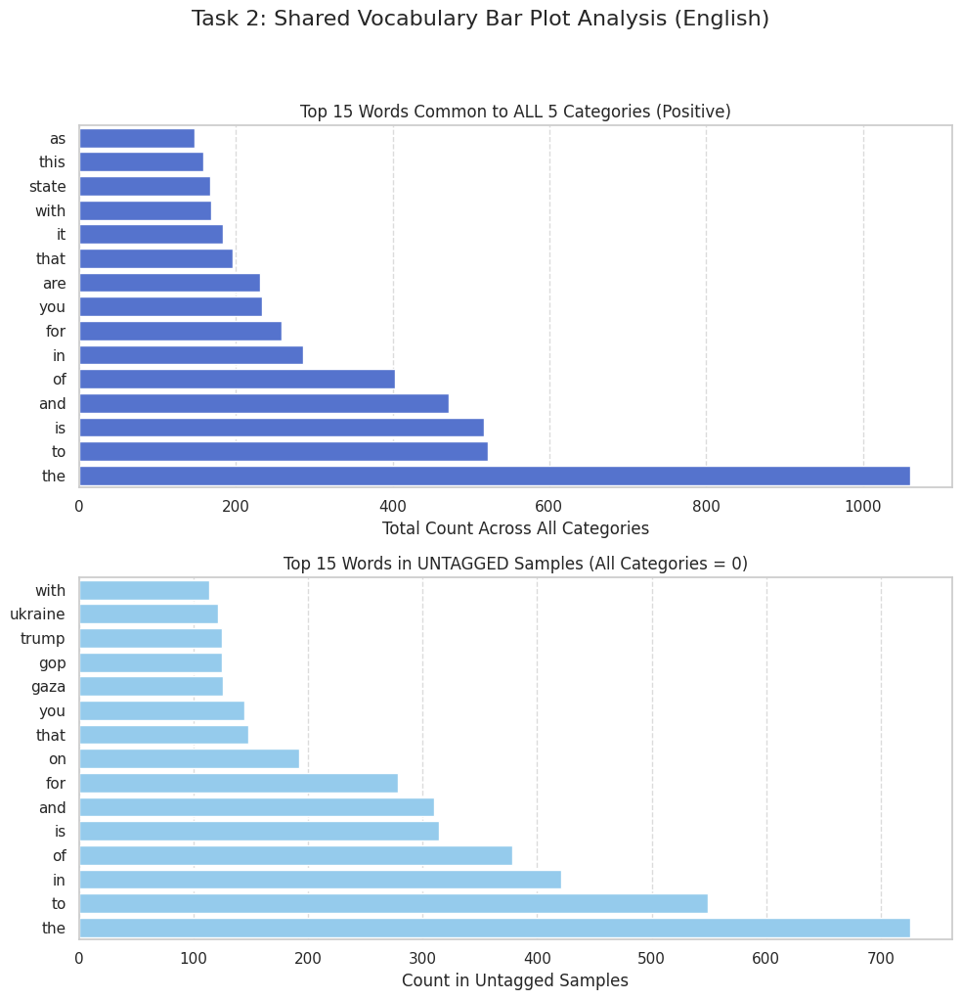


Starting Shared Vocabulary Analysis for Swahili...


/tmp/ipython-input-368224574.py:89: UserWarning: 
The palette list has fewer values (1) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(
/tmp/ipython-input-368224574.py:106: UserWarning: 
The palette list has fewer values (1) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(


Bar plot analysis saved to: /content/drive/MyDrive/NLP course/Figures/task2_shared_vocabulary_barplots_Swahili.pdf


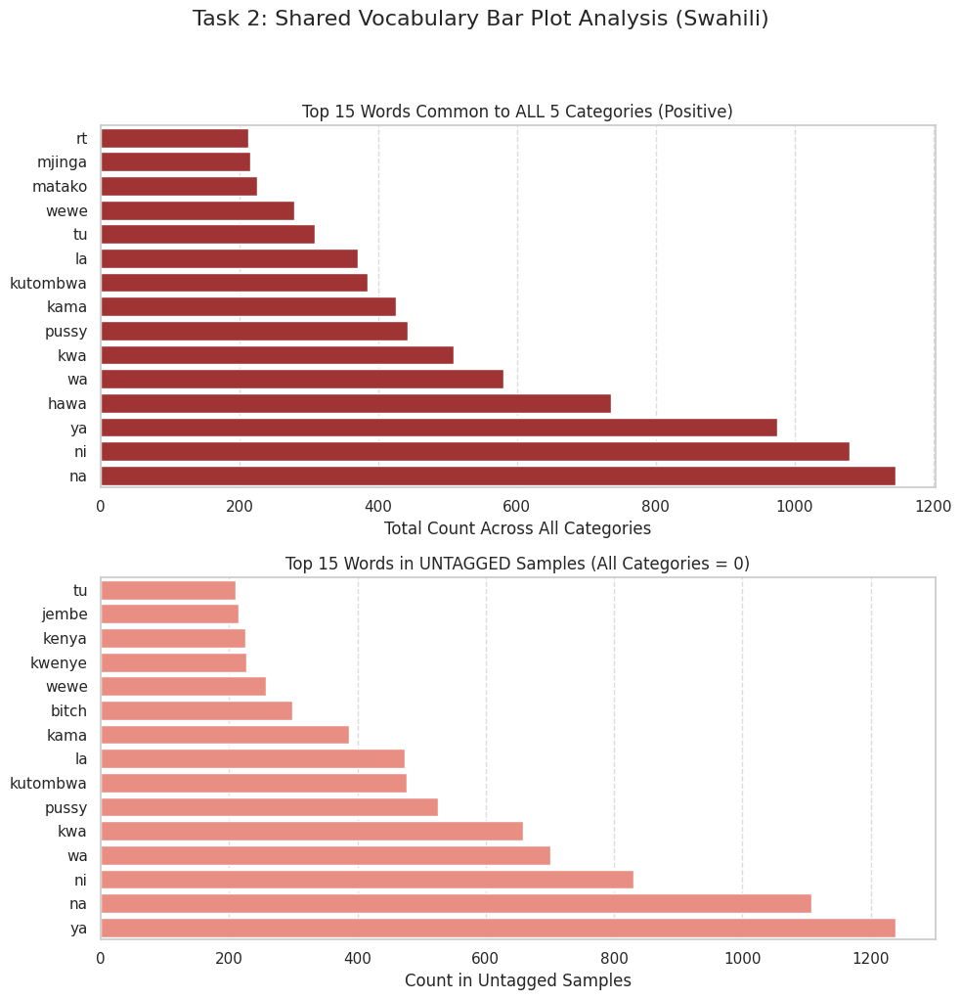

In [ ]:

# 1. Run the analysis for English
print("Starting Shared Vocabulary Analysis for English...")
plot_shared_vocabulary_barplots(df_1, figures_dir)


# 2. Run the analysis for Swahili
print("\nStarting Shared Vocabulary Analysis for Swahili...")
plot_shared_vocabulary_barplots(df_2, figures_dir)





## 8. Final Interpretation: Shared Vocabulary Bar Plots (Task 2)

This comprehensive set of bar plots visualizes the vocabulary that is **common across all categories** (Top) and the vocabulary present in the **untagged polarized samples** (Bottom).

### English Analysis (Blue Plots)

| Plot | Top Words | Interpretation | Strategic Impact |
| :--- | :--- | :--- | :--- |
| **Top 5 Shared (Across ALL 5 Categories - Dark Blue)** | **the, to, is, and, of** | These are classic **English Stop Words** (function words). Their presence across every category confirms they carry **zero** thematic or polarizing information. | **Action:** Must be removed or handled by **TF-IDF** (which naturally lowers their weight) during tokenization for the model. |
| **Top 5 Untagged (All Categories = 0 - Light Blue)** | **the, to, in, of, and, is, for** (Stop Words) + **ukraine, trump, gop, gaza** (Content Words) | The most frequent words are still Stop Words. However, the presence of specific content words like **`ukraine`**, **`trump`**, **`gop`**, and **`gaza`** shows that **untagged polarization** still revolves around major political and geopolitical events, but the posts lack the specific indicators (e.g., explicit hate terms, racial slurs) to be assigned to one of the five formal categories. | **Insight:** Untagged polarized content is often **mainstream political commentary** that is strongly worded but not hate speech, or content that falls strictly outside the five defined targets (which is the intended function of "Other"). |

### Swahili Analysis (Red Plots)

| Plot | Top Words | Interpretation | Strategic Impact |
| :--- | :--- | :--- | :--- |
| **Top 5 Shared (Across ALL 5 Categories - Dark Red)** | **na, ni, ya, hawa, wa** (Function/Pronouns) + **pussy, kutombwa, kama** (Explicit Slang) | The vocabulary is a mix of high-frequency **Swahili function words** and **highly explicit vulgar slang**. This confirms that vulgarity, not just specific target words, is the core linguistic feature common to ALL hate speech categories in Swahili. | **Insight:** Vulgar words are strong markers of polarization, but not of category. The model must ignore the function words and look for contextual/thematic words to distinguish categories. |
| **Top 5 Untagged (All Categories = 0 - Light Red)** | **ya, na, ni, wa, kwa** (Function Words) + **pussy, kutombwa, kama, bitch, wewe, kenya** (Explicit Slang/Insults) | The vocabulary is almost identical to the Shared list, still dominated by **explicit slang and function words**. The list also includes the country name **`kenya`** and the insult **`bitch`**. | **Insight:** Polarized content that goes *untagged* is still very vulgar and often directed at common targets (e.g., Kenya/politicians). This suggests the annotators had difficulty distinguishing between **general vulgar abuse** and **category-specific hate speech**, reinforcing the need for very specific features in the Swahili model. |

### Final Modeling Strategy Summary

1.  **Stop Word Removal:** Mandatory for English. Highly beneficial for Swahili to filter out function words and focus on content.
2.  **Explicit Slang:** Terms like *pussy* and *kutombwa* are **strong predictors of polarization (Task 1)** but carry **no predictive value for the category (Task 2)** in Swahili. The model must learn to ignore these high-frequency, non-discriminating vulgar terms for Task 2.
3.  **Feature Focus:**
    *   **English:** Model features should focus on named entities (`Gaza`, `Ukraine`, `Trump`) and ideological terms (`fascist`, `xenophobia`).
    *   **Swahili:** Model features must focus on words that appear **outside** of this shared list to find the subtle differences between `racial/ethnic` and `political`.

Subtask 3: Manifestation Identification

In [ ]:
# Path to the first language  english dataset
path_en  = "/content/drive/MyDrive/NLP course /dev_phase /subtask3/train/eng.csv"
path_sw = "/content/drive/MyDrive/NLP course /dev_phase /subtask3/train/swa.csv"
df_1 = pd.read_csv(path_en)  # English
df_1['language'] = 'English'

df_2 = pd.read_csv(path_sw)  # Swahili
df_2['language'] = 'Swahili'


general statistics

In [ ]:
# Define the full set of potential Task 3 manifestation labels
FULL_MANIFESTATION_COLS = [
    "stereotype", "vilification", "dehumanization", "extreme_language",
    "lack_of_empathy", "invalidation"
]

def get_task3_general_statistics(df, lang_name):
    """
    Calculates and prints general statistics for the multi-label Task 3 (Manifestation),
    including a check for samples with ZERO assigned manifestations, labeled as "Non-Polarized."

    Args:
        df (pd.DataFrame): The DataFrame subset containing samples with manifestation labels.
        lang_name (str): The name of the language (e.g., 'English').
    """

    print(f"\n--- General Statistics for {lang_name} (Task 3: Manifestations) ---")

    # 1. Determine which labels are present in the current DataFrame
    present_labels = [col for col in FULL_MANIFESTATION_COLS if col in df.columns]

    if not present_labels:
        print("CRITICAL ERROR: No manifestation label columns found in DataFrame. Cannot proceed.")
        return

    # 2. Total Samples & Non-Polarized Check
    total_samples = len(df)
    print(f"Total Samples: {total_samples}")
    print(f"Labels Present: {', '.join(present_labels)}")

    # Calculate sum of all tags per sample
    df['total_manifestation_tags'] = df[present_labels].sum(axis=1)

    # --- CHECK FOR ALL ZEROS ---
    zero_manifestation_count = (df['total_manifestation_tags'] == 0).sum()

    # Use "Non-Polarized" as requested for the count of zero-tag samples
    print(f"\nSamples with ZERO Manifestations (Non-Polarized): {zero_manifestation_count} ({zero_manifestation_count/total_samples * 100:.2f}%)")


    # 3. Manifestation Counts and Distribution (Multi-Label)

    # Calculate the count of '1's for each present label
    manifestation_counts = df[present_labels].sum().sort_values(ascending=False)
    total_tags = manifestation_counts.sum()

    print(f"\nTotal Manifestation Tags Assigned: {total_tags}")

    # Add the zero-count as a derived "Non-Polarized" class for reporting
    reporting_counts = manifestation_counts.copy()
    reporting_counts['Non-Polarized'] = zero_manifestation_count

    print("Label Counts per Manifestation (Including Non-Polarized):")
    print(reporting_counts.sort_values(ascending=False).to_string())

    # Percentage of Total Tags (shows the dominance of each category among all tags)
    category_percentage = (manifestation_counts / total_tags) * 100
    print("\nPercentage of Official Tags per Manifestation:")
    print(category_percentage.round(2).to_string())

    # 4. Text Length Statistics

    # Calculate text length if not already present
    if 'text_len' not in df.columns:
        df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))

    length_stats = {
        "Total Tags / Total Samples Ratio": total_tags / total_samples,
        "Mean": df['text_len'].mean(),
        "Median": df['text_len'].median(),
        "Min": df['text_len'].min(),
        "Max": df['text_len'].max(),
        "Std": df['text_len'].std()
    }

    print("\nText Length (tokens) statistics:")
    for stat, value in length_stats.items():
        # Format the output based on the statistic type
        print(f"{stat}: {value:.2f}")

In [ ]:
import pandas as pd
import numpy as np
# Assuming the function get_task3_general_statistics is defined from the previous response

# --- Execute on English (df_1) ---
get_task3_general_statistics(df_1, 'English')

# --- Execute on Swahili (df_2) ---
get_task3_general_statistics(df_2, 'Swahili')


--- General Statistics for English (Task 3: Manifestations) ---
Total Samples: 3222
Labels Present: stereotype, vilification, dehumanization, extreme_language, lack_of_empathy, invalidation

Samples with ZERO Manifestations (Non-Polarized): 2047 (63.53%)

Total Manifestation Tags Assigned: 3449
Label Counts per Manifestation (Including Non-Polarized):
Non-Polarized       2047
vilification         858
extreme_language     770
invalidation         586
stereotype           487
dehumanization       391
lack_of_empathy      357

Percentage of Official Tags per Manifestation:
vilification        24.88
extreme_language    22.33
invalidation        16.99
stereotype          14.12
dehumanization      11.34
lack_of_empathy     10.35

Text Length (tokens) statistics:
Total Tags / Total Samples Ratio: 1.07
Mean: 12.26
Median: 9.00
Min: 4.00
Max: 60.00
Std: 8.02

--- General Statistics for Swahili (Task 3: Manifestations) ---
Total Samples: 6991
Labels Present: stereotype, vilification, dehumaniza

Manifestation Distribution Plot (Bar Chart)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

# Define the full set of potential Task 3 manifestation labels
FULL_MANIFESTATION_COLS = [
    "stereotype", "vilification", "dehumanization", "extreme_language",
    "lack_of_empathy", "invalidation"
]

def plot_task3_manifestation_distribution(df, figures_dir):

    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    # Identify labels present in the DataFrame
    present_labels = [col for col in FULL_MANIFESTATION_COLS if col in df.columns]

    if not present_labels:
        print(f"Skipping plot for {lang_name}: No manifestation labels found.")
        return

    # 1. Calculate the total counts for each official label
    manifestation_counts = df[present_labels].sum()

    # 2. Calculate the "Non-Polarized" (zero-tag) count
    zero_manifestation_count = (df[present_labels].sum(axis=1) == 0).sum()

    # 3. Combine official counts with the derived "Non-Polarized" count
    # Note: Use a Series to combine for plotting and sort by value
    plot_series = pd.concat([
        manifestation_counts,
        pd.Series([zero_manifestation_count], index=['Non-Polarized'])
    ]).sort_values(ascending=False)

    # 4. Determine Color based on language
    if 'english' in lang_lower:
        plot_color = 'blue'
    elif 'swahili' in lang_lower:
        plot_color = 'red'
    else:
        plot_color = 'gray'

    # 5. Create the plot
    plt.figure(figsize=(14, 6))

    # Use seaborn barplot
    sns.barplot(
        x=plot_series.index,
        y=plot_series.values,
        hue=plot_series.index,
        palette=[plot_color],
        legend=False
    )

    plt.title(f"Task 3: Manifestation Distribution (Incl. Non-Polarized) ({lang_name})", fontsize=15)
    plt.xlabel("Polarization Manifestation")
    plt.ylabel("Total Number of Tags Assigned / Samples (for Non-Polarized)")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 6. Save and Show figure (PDF)
    filename = f"task3_manifestation_distribution_incl_non_polarized_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))
    plt.show()
    plt.close()


[ENGLISH MANIFESTATION ANALYSIS]
-----------------------------------

--- General Statistics for English (Task 3: Manifestations) ---
Total Samples: 3222
Labels Present: stereotype, vilification, dehumanization, extreme_language, lack_of_empathy, invalidation

Samples with ZERO Manifestations (Non-Polarized): 2047 (63.53%)

Total Manifestation Tags Assigned: 3449
Label Counts per Manifestation (Including Non-Polarized):
Non-Polarized       2047
vilification         858
extreme_language     770
invalidation         586
stereotype           487
dehumanization       391
lack_of_empathy      357

Percentage of Official Tags per Manifestation:
vilification        24.88
extreme_language    22.33
invalidation        16.99
stereotype          14.12
dehumanization      11.34
lack_of_empathy     10.35

Text Length (tokens) statistics:
Total Tags / Total Samples Ratio: 1.07
Mean: 12.26
Median: 9.00
Min: 4.00
Max: 60.00
Std: 8.02

Generating English Distribution Plot...


/tmp/ipython-input-3010574536.py:49: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(


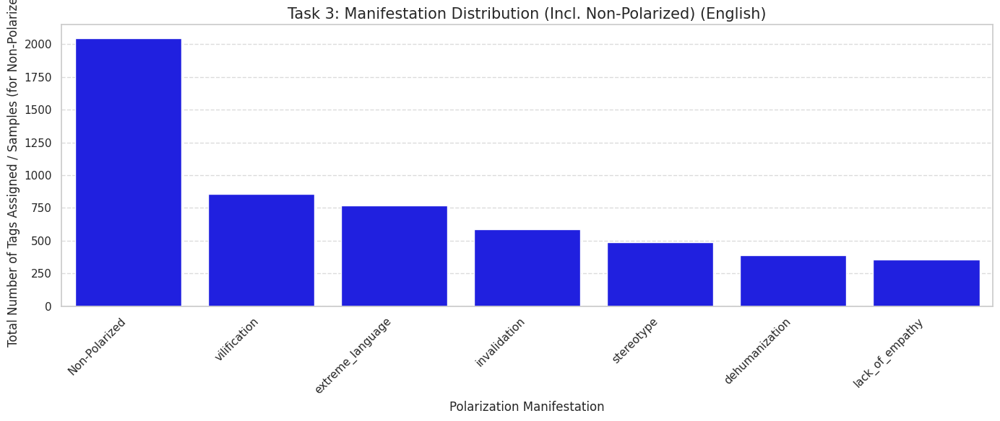

In [ ]:

# --- ENGLISH ANALYSIS (df_1) ---
print("\n[ENGLISH MANIFESTATION ANALYSIS]")
print("-----------------------------------")

# 1. General Statistics (Text Output)
get_task3_general_statistics(df_1, 'English')

# 2. Manifestation Distribution Plot (Bar Chart)
print("\nGenerating English Distribution Plot...")
plot_task3_manifestation_distribution(df_1, figures_dir)


In [ ]:
# 1. General Statistics (Text Output)
get_task3_general_statistics(df_2, 'Swahili')


--- General Statistics for Swahili (Task 3: Manifestations) ---
Total Samples: 6991
Labels Present: stereotype, vilification, dehumanization, extreme_language, lack_of_empathy, invalidation

Samples with ZERO Manifestations (Non-Polarized): 3487 (49.88%)

Total Manifestation Tags Assigned: 11941
Label Counts per Manifestation (Including Non-Polarized):
Non-Polarized       3487
vilification        2883
stereotype          2775
lack_of_empathy     2080
extreme_language    1673
invalidation        1637
dehumanization       893

Percentage of Official Tags per Manifestation:
vilification        24.14
stereotype          23.24
lack_of_empathy     17.42
extreme_language    14.01
invalidation        13.71
dehumanization       7.48

Text Length (tokens) statistics:
Total Tags / Total Samples Ratio: 1.71
Mean: 12.54
Median: 12.00
Min: 2.00
Max: 48.00
Std: 6.05



Generating Swahili Distribution Plot...


/tmp/ipython-input-3010574536.py:49: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(


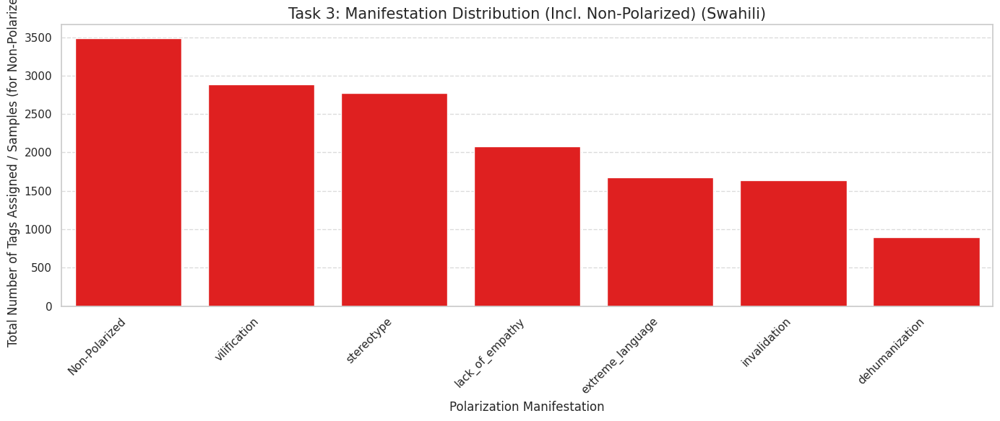

In [ ]:
# 2. Manifestation Distribution Plot (Bar Chart)
print("\nGenerating Swahili Distribution Plot...")
plot_task3_manifestation_distribution(df_2, figures_dir)

 Manifestation Correlation Plot (Heatmap)

In [ ]:

FULL_MANIFESTATION_COLS = [
    "stereotype", "vilification", "dehumanization", "extreme_language",
    "lack_of_empathy", "invalidation"
]

def plot_task3_manifestation_correlation(df, figures_dir):

    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    present_labels = [col for col in FULL_MANIFESTATION_COLS if col in df.columns]

    if len(present_labels) < 2:
        print(f"Skipping correlation plot for {lang_name}: Fewer than 2 manifestation labels found.")
        return

    # --- Color Determination (for diverging color map) ---
    if 'english' in lang_lower:
        cmap_name = 'Blues'
    elif 'swahili' in lang_lower:
        cmap_name = 'Reds'
    else:
        cmap_name = 'viridis'

    # 1. Calculate the correlation matrix
    correlation_matrix = df[present_labels].corr()

    # 2. Plot the Correlation Matrix
    plt.figure(figsize=(9, 8))
    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap=cmap_name,
        fmt=".2f",
        linewidths=.5,
        vmin=-0.2,
        vmax=1.0,
        cbar_kws={'label': 'Pearson Correlation (Co-occurrence)'}
    )

    plt.title(f"Task 3: Manifestation Correlation Matrix ({lang_name})", fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()

    # 3. Save and Show figure (PDF)
    filename = f"task3_manifestation_correlation_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))
    plt.show()
    plt.close()


Generating English Correlation Plot...


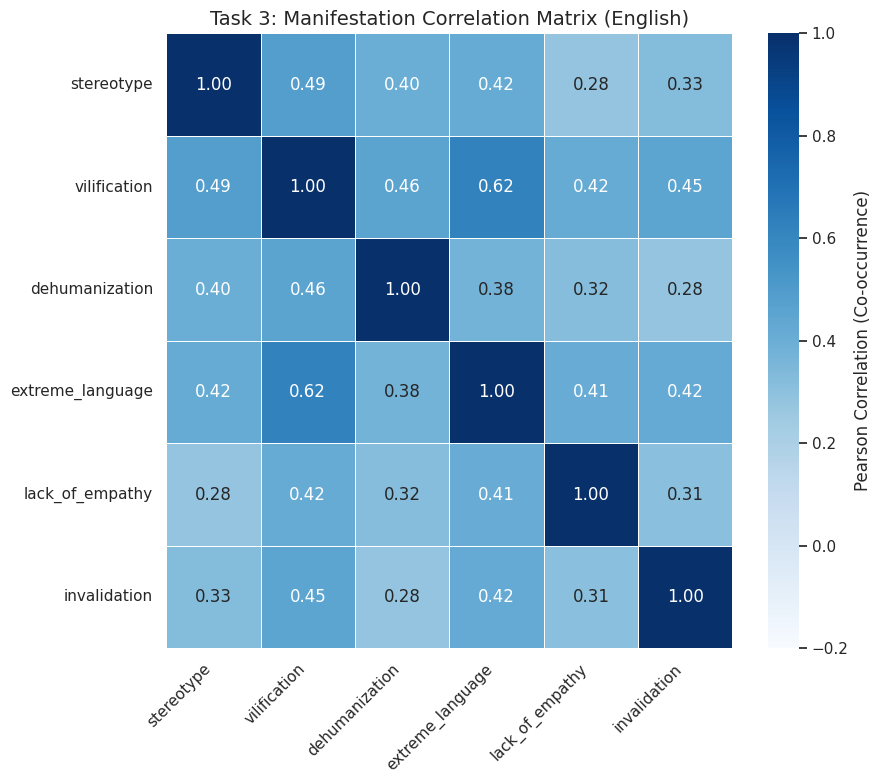

In [ ]:

# 3. Manifestation Correlation Plot (Heatmap)
print("\nGenerating English Correlation Plot...")
plot_task3_manifestation_correlation(df_1, figures_dir)


Generating Swahili Correlation Plot...


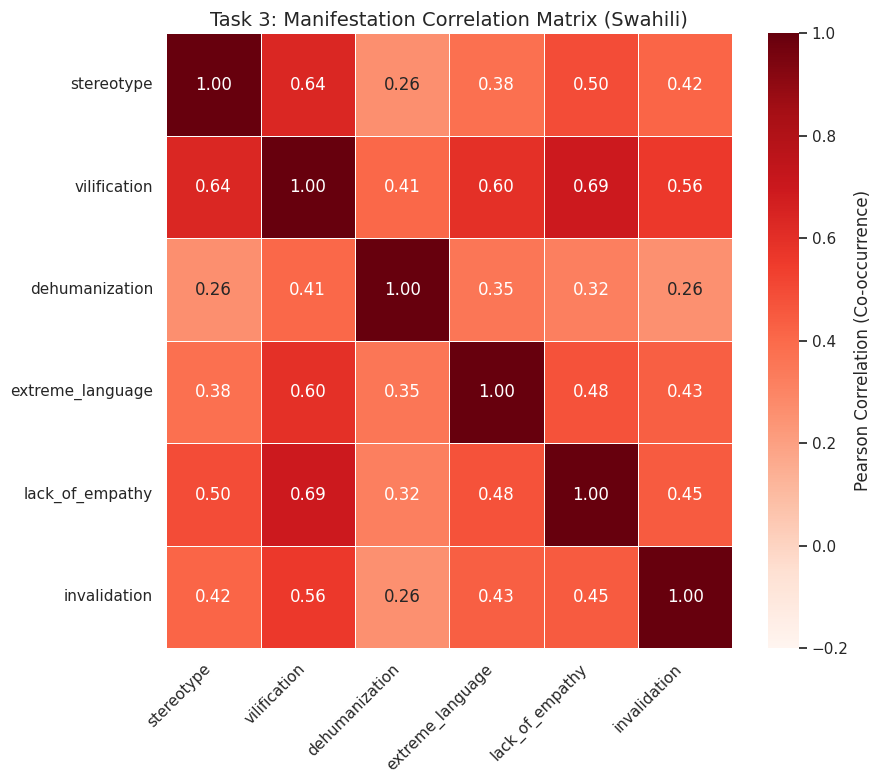

In [ ]:

# 3. Manifestation Correlation Plot (Heatmap)
print("\nGenerating Swahili Correlation Plot...")
plot_task3_manifestation_correlation(df_2, figures_dir)

Text Length vs. Manifestation Plot (Box Plot)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

# Define the full set of potential Task 3 manifestation labels
FULL_MANIFESTATION_COLS = [
    "stereotype", "vilification", "dehumanization", "extreme_language",
    "lack_of_empathy", "invalidation"
]

def plot_length_by_manifestation_boxplot(df, figures_dir):

    lang_name = df['language'].iloc[0] if not df.empty and 'language' in df.columns else 'Unknown'
    lang_lower = lang_name.lower()

    # Calculate text length if not already done
    if 'text_len' not in df.columns:
        df['text_len'] = df['text'].apply(lambda x: len(str(x).split()))

    present_labels = [col for col in FULL_MANIFESTATION_COLS if col in df.columns]

    if not present_labels:
        print(f"Skipping length plot for {lang_name}: No manifestation labels found.")
        return

    # --- 1. Identify the 'Non-Polarized' group ---
    # Create a boolean series that is True if ALL official tags are 0
    is_non_polarized = (df[present_labels].sum(axis=1) == 0)

    # --- 2. Prepare Data for Plotting (Explode multi-label data) ---
    plot_data = []

    # A. Add the Official Manifestations
    for col in present_labels:
        # Filter rows where the column is 1 (tagged with this manifestation)
        df_temp = df[df[col] == 1].copy()
        df_temp['manifestation'] = col
        plot_data.append(df_temp[['text_len', 'manifestation']])

    # B. Add the Non-Polarized Category
    df_non_polarized = df[is_non_polarized].copy()
    df_non_polarized['manifestation'] = 'Non-Polarized'
    plot_data.append(df_non_polarized[['text_len', 'manifestation']])


    # Combine all data
    df_long = pd.concat(plot_data, ignore_index=True)

    # --- 3. Determine Colors ---
    # Use different shades of the language's dominant color (Blues/Reds)
    if 'english' in lang_lower:
        palette_name = 'Blues_d'
    elif 'swahili' in lang_lower:
        palette_name = 'Reds_d'
    else:
        palette_name = 'viridis'

    # --- 4. Create Plot ---
    plt.figure(figsize=(12, 6))

    sns.boxplot(
        data=df_long,
        x='manifestation',
        y='text_len',
        hue='manifestation',
        palette=palette_name,
        legend=False,
        showfliers=False
    )

    # Set plot titles and labels
    plt.title(f"Task 3: Text Length Distribution by Manifestation (Incl. Non-Polarized) ({lang_name})", fontsize=15)
    plt.xlabel("Polarization Manifestation")
    plt.ylabel("Number of Tokens")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 5. Save and Show figure (PDF)
    filename = f"task3_length_by_manifestation_incl_non_polarized_{lang_name}.pdf"
    plt.savefig(os.path.join(figures_dir, filename))
    plt.show()
    plt.close()


Generating English Length Box Plot...


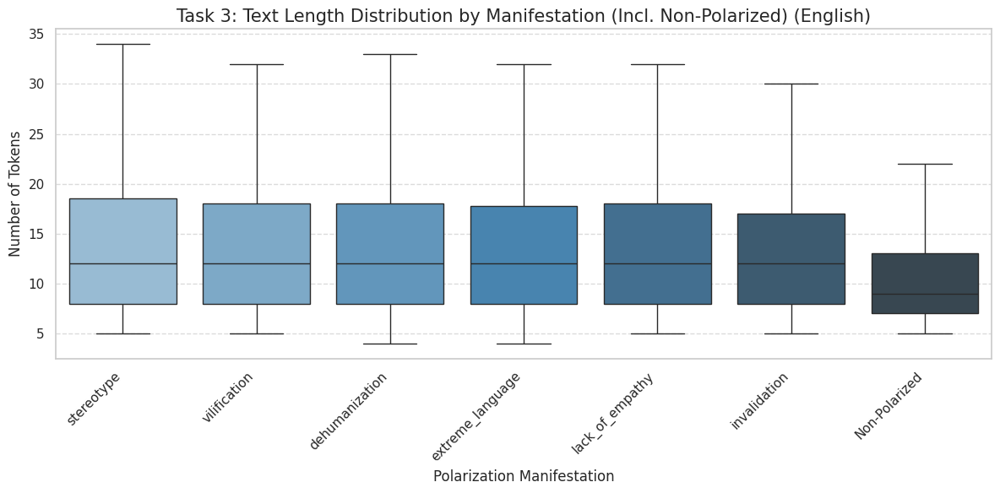


Generating Swahili Length Box Plot...


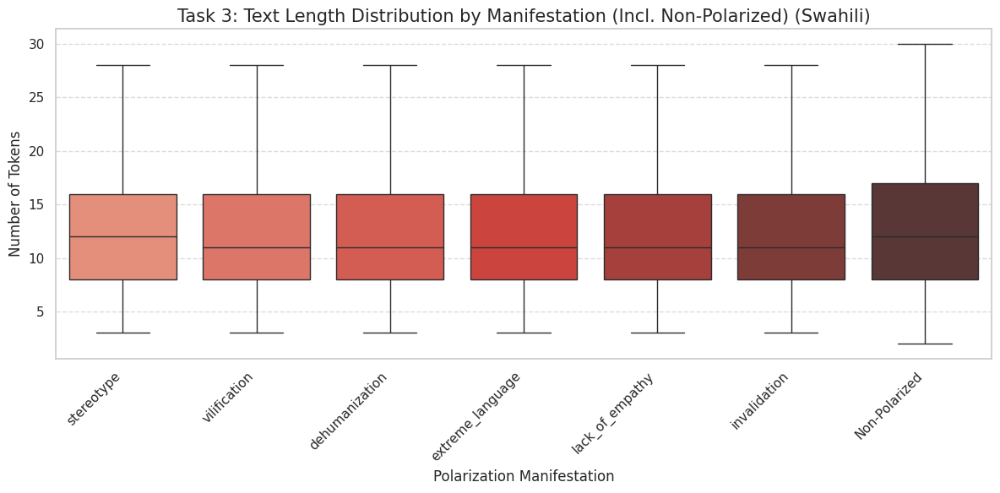


--- Task 3 EDA Complete. Proceed to Interpretation. ---


In [ ]:


# 4. Text Length vs. Manifestation Plot (Box Plot)
print("\nGenerating English Length Box Plot...")
plot_length_by_manifestation_boxplot(df_1, figures_dir)



# 4. Text Length vs. Manifestation Plot (Box Plot)
print("\nGenerating Swahili Length Box Plot...")
plot_length_by_manifestation_boxplot(df_2, figures_dir)

print("\n--- Task 3 EDA Complete. Proceed to Interpretation. ---")